# Overview "problem" and data available

### Problem

A new disease has recently been discovered by Dr. Smith, in England.
The disease has already affected more than 5000 people, with no apparent connection between them.
The most common symptoms include fever and tiredness, but some infected people are asymptomatic.
Regardless, this virus is being associated with post-disease conditions such as loss of speech, confusion, chest pain and shortness of breath. The conditions of the transmission of the disease are still unknown and there are no certainties of what leads a patient to suffer or not from it. Nonetheless, some groups of people seem more prone to be infected by the parasite than others.

### Objective 

Build a predictive model (Classification model) that answers the question, “Who are the people more likely to suffer from the Smith Parasite?”

### Data available

* train_demo.xlsx
* train_habits.xlsx
* train_health.xlsx

* test_demo.xlsx
* test_habits.xlsx
* test_health.xlsx

# 1. Import libraries

In [1]:
import pandas as pd
import os
import seaborn as sns
import numpy as np
from math import ceil
from itertools import product
from pandas_profiling import ProfileReport
from datetime import datetime
import matplotlib.pyplot as plt


from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import LocalOutlierFactor
from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import model_selection
from sklearn.utils import class_weight
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import mean_squared_error
import timeit
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import f1_score
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from yellowbrick.model_selection import rfecv



import scipy.stats as stats
from scipy.stats import chi2_contingency


import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, can change 'svg' to 'retina'



# Seeting seaborn style
sns.set()

# 2. Import data

In [2]:
# Import xlsx file "train_demo.xlsx" and store it in the object train_demo

train_demo = pd.read_excel('train_demo.xlsx') 
#train_demo

In [3]:
# Import xlsx file "train_habits.xlsx" and store it in the object train_habits

train_habits= pd.read_excel('train_habits.xlsx') 
#train_habits

In [4]:
# Import xlsx file "train_health.xlsx" and store it in the object train_health

train_health= pd.read_excel('train_health.xlsx') 
#train_health

In [5]:
# Import xlsx file "test_demo.xlsx" and store it in the object test_demo

test_demo = pd.read_excel('test_demo.xlsx') 
#test_demo

In [6]:
# Import xlsx file "test_habits.xlsx" and store it in the object test_habits

test_habits = pd.read_excel('test_habits.xlsx') 
#test_habits

In [7]:
# Import xlsx file "test_health.xlsx" and store it in the object test_health

test_health = pd.read_excel('test_health.xlsx') 
#test_health

### Metadata 

#### Demo Data

* PatientID - The unique identifier of the patient
* Birth_Year - Patient Year of Birth
* Name - Name of the patient
* Region - Patient Living Region
* Education - Answer to the question: What is the highest grade or year of school you have?
* Disease - The dependent variable. If the patient has the disease (Disease = 1) or not (Disease = 0)

#### Habits Data

* PatientID -The unique identifier of the patient
* Smoking Habit - Answer to the question: Do you smoke more than 10 cigars daily?
* Drinking Habit - Answer to the question: What is your behaviour concerning alcohol consumption?
* Exercise - Answer to the question: Do you exercise (more than 30 minutes) 3 times per week or more?
* Fruit Habit  - Answer to the question: How many portions of fruits do you consume per day?
* Water Habit - Answer to the question: How much water do you drink per day?

#### Health Data 

* PatientID - The unique identifier of the patient
* Height - Patient’s height
* Weight - Patient’s weight
* Checkup - Answer to the question: How long has it been since you last visited a doctor for a routine Checkup? A routine Checkup is a general physical exam, not an exam for a specific injury, illness, or condition.
* Diabetes - Answer to the question: (Ever told) you or your direct relatives have diabetes?
* HighCholesterol - Cholesterol value
* BloodP ressure - Blood Pressure in rest value
* Mental Health - Answer to the question: During the past 30 days, for about how many days did poor physical or mental health keep you from doing your usual activities, such as self-care, work, or recreation?
* Physical Health - Answer to the question: Thinking about your physical health, which includes physical illness and injury, for how many days during the past 30 days was your physical health not good to the point where it was difficult to walk? 

# 3. Reading data

Describe the studied population using statistical measures, meaningful insights and visualizations representative of the major insights.

## Train Data

* Head
* Set_index
* Info
* Check Duplicates
* Data types

#### Train Demo

In [8]:
# check the first five rows of the dataset 
train_demo.head()

,PatientID,Name,Birth_Year,Region,Education,Disease
0,1167,Mrs. Stephanie Gay,1965,London,High School Incomplete (10th to 11th grade),1
1,1805,Mr. Sherman Nero,1969,South West,High School Incomplete (10th to 11th grade),1
2,1557,Mr. Mark Boller,1974,Yorkshire and the Humber,Elementary School (1st to 9th grade),1
3,1658,Mr. David Caffee,1958,London,University Complete (3 or more years),0
4,1544,Mr. Gerald Emery,1968,South East,University Incomplete (1 to 2 years),1


In [9]:
# set "PatientID" as index
train_demo.set_index('PatientID', inplace = True)

#### Train Habits 

In [10]:
#  Check the first five rows of the dataset 
train_habits.head()

,PatientID,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit
0,1167,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters
1,1805,No,I consider myself a social drinker,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters
2,1557,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter
3,1658,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter
4,1544,No,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,More than half a liter but less than one liter


In [11]:
# set "PatientID" as index
train_habits.set_index('PatientID', inplace = True)

#### Train Health

In [12]:
#  Check the first five rows of the dataset 
train_health.head()

,PatientID,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
0,1167,155,67,358,120,21,2,More than 3 years,Neither I nor my immediate family have diabetes.
1,1805,173,88,230,142,9,0,Not sure,Neither I nor my immediate family have diabetes.
2,1557,162,68,226,122,26,0,More than 3 years,Neither I nor my immediate family have diabetes.
3,1658,180,66,313,125,13,8,Not sure,I have/had pregnancy diabetes or borderline di...
4,1544,180,58,277,125,18,2,More than 3 years,I have/had pregnancy diabetes or borderline di...


In [13]:
# set "PatientID" as index
train_health.set_index('PatientID', inplace = True)

### Data integration

#### Train dataset (Demo + Habits + Health)

In [14]:
# merge train datasets (Demo + Habits + Health) and create "train_data"

train_data = train_demo.join([train_habits,train_health])
train_data.head()

,Name,Birth_Year,Region,Education,Disease,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
PatientID,,,,,,,,,,,,,,,,,,
1167,Mrs. Stephanie Gay,1965,London,High School Incomplete (10th to 11th grade),1,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters,155,67,358,120,21,2,More than 3 years,Neither I nor my immediate family have diabetes.
1805,Mr. Sherman Nero,1969,South West,High School Incomplete (10th to 11th grade),1,No,I consider myself a social drinker,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters,173,88,230,142,9,0,Not sure,Neither I nor my immediate family have diabetes.
1557,Mr. Mark Boller,1974,Yorkshire and the Humber,Elementary School (1st to 9th grade),1,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter,162,68,226,122,26,0,More than 3 years,Neither I nor my immediate family have diabetes.
1658,Mr. David Caffee,1958,London,University Complete (3 or more years),0,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter,180,66,313,125,13,8,Not sure,I have/had pregnancy diabetes or borderline di...
1544,Mr. Gerald Emery,1968,South East,University Incomplete (1 to 2 years),1,No,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,More than half a liter but less than one liter,180,58,277,125,18,2,More than 3 years,I have/had pregnancy diabetes or borderline di...


## Test Data

### Reading data

#### Test Demo

In [15]:
# check the first five rows of the dataset 
test_demo.head()

,PatientID,Name,Birth_Year,Region,Education
0,1343,Mr. Ricardo Sherman,1970,East Midlands,Elementary School (1st to 9th grade)
1,1727,Mr. Jessie Strickland,1966,Yorkshire and the Humber,University Complete (3 or more years)
2,1828,Mr. Robert Foreman,1978,West Midlands,High School Incomplete (10th to 11th grade)
3,1155,Mr. Edwin Ferguson,1968,Yorkshire and the Humber,High School Incomplete (10th to 11th grade)
4,1020,Mr. Eliseo Krefft,1962,East Midlands,High School Incomplete (10th to 11th grade)


In [16]:
# set "PatientID" as index
test_demo.set_index('PatientID', inplace = True)

#### Test Habits

In [17]:
# check the first five rows of the dataset 
test_habits.head()

,PatientID,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit
0,1343,Yes,I usually consume alcohol every day,No,Less than 1. I do not consume fruits every day.,Between one liter and two liters
1,1727,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter
2,1828,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters
3,1155,No,I usually consume alcohol every day,No,Less than 1. I do not consume fruits every day.,Less than half a liter
4,1020,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,Less than half a liter


In [18]:
# set "PatientID" as index
test_habits.set_index('PatientID', inplace = True)

#### Test Health

In [19]:
# check the first five rows of the dataset 
test_health.head()

,PatientID,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
0,1343,172,80,203,172,20,2,Not sure,I have/had pregnancy diabetes or borderline di...
1,1727,171,80,225,130,21,0,Not sure,I do have diabetes
2,1828,171,78,237,130,24,1,More than 3 years,I have/had pregnancy diabetes or borderline di...
3,1155,174,87,313,108,19,0,Not sure,I do have diabetes
4,1020,172,56,189,140,19,14,More than 3 years,I have/had pregnancy diabetes or borderline di...


In [20]:
# set "PatientID" as index
test_health.set_index('PatientID', inplace = True)

###  Data integration

#### Test dataset (Demo + Habits + Health)

In [21]:
# merge train datasets (Demo + Habits + Health) and create "train_data"

test = test_demo.join([test_habits,test_health])
test.head()

,Name,Birth_Year,Region,Education,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
PatientID,,,,,,,,,,,,,,,,,
1343,Mr. Ricardo Sherman,1970,East Midlands,Elementary School (1st to 9th grade),Yes,I usually consume alcohol every day,No,Less than 1. I do not consume fruits every day.,Between one liter and two liters,172,80,203,172,20,2,Not sure,I have/had pregnancy diabetes or borderline di...
1727,Mr. Jessie Strickland,1966,Yorkshire and the Humber,University Complete (3 or more years),No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter,171,80,225,130,21,0,Not sure,I do have diabetes
1828,Mr. Robert Foreman,1978,West Midlands,High School Incomplete (10th to 11th grade),No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters,171,78,237,130,24,1,More than 3 years,I have/had pregnancy diabetes or borderline di...
1155,Mr. Edwin Ferguson,1968,Yorkshire and the Humber,High School Incomplete (10th to 11th grade),No,I usually consume alcohol every day,No,Less than 1. I do not consume fruits every day.,Less than half a liter,174,87,313,108,19,0,Not sure,I do have diabetes
1020,Mr. Eliseo Krefft,1962,East Midlands,High School Incomplete (10th to 11th grade),No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,Less than half a liter,172,56,189,140,19,14,More than 3 years,I have/had pregnancy diabetes or borderline di...


### Split train and validation

In [22]:
# train(70%) and validation(30%)
y = train_data['Disease']
train_data, val_data = train_test_split(train_data, test_size = 0.3, random_state = 0, stratify = y, shuffle = True)

## 4. Data Exploration

* Check missing values
* Find inconsistent values
* Descriptive statistics: boxplot, pairwise, barplot, histogram, min/max/std/var

### Train and Validation

#### Check Missing Values 

In [23]:
# Count missing values 
# replace "" by nans
train_data.replace("", np.nan, inplace=True)

# count of missing values
train_data.isna().sum()

Name                0
Birth_Year          0
Region              0
Education           9
Disease             0
Smoking_Habit       0
Drinking_Habit      0
Exercise            0
Fruit_Habit         0
Water_Habit         0
Height              0
Weight              0
High_Cholesterol    0
Blood_Pressure      0
Mental_Health       0
Physical_Health     0
Checkup             0
Diabetes            0
dtype: int64

In [24]:
# count missing values 
# replace "" by nans
val_data.replace("", np.nan, inplace=True)

# count of missing values
val_data.isna().sum()

Name                0
Birth_Year          0
Region              0
Education           4
Disease             0
Smoking_Habit       0
Drinking_Habit      0
Exercise            0
Fruit_Habit         0
Water_Habit         0
Height              0
Weight              0
High_Cholesterol    0
Blood_Pressure      0
Mental_Health       0
Physical_Health     0
Checkup             0
Diabetes            0
dtype: int64

#### Check Duplicates 

In [25]:
# duplicated observations
train_data.duplicated().sum()

0

In [26]:
val_data.duplicated().sum()

0

#### Check Data Types

In [27]:
# dataset data types
train_data.dtypes

Name                object
Birth_Year           int64
Region              object
Education           object
Disease              int64
Smoking_Habit       object
Drinking_Habit      object
Exercise            object
Fruit_Habit         object
Water_Habit         object
Height               int64
Weight               int64
High_Cholesterol     int64
Blood_Pressure       int64
Mental_Health        int64
Physical_Health      int64
Checkup             object
Diabetes            object
dtype: object

In [28]:
# dataset data types
val_data.dtypes

Name                object
Birth_Year           int64
Region              object
Education           object
Disease              int64
Smoking_Habit       object
Drinking_Habit      object
Exercise            object
Fruit_Habit         object
Water_Habit         object
Height               int64
Weight               int64
High_Cholesterol     int64
Blood_Pressure       int64
Mental_Health        int64
Physical_Health      int64
Checkup             object
Diabetes            object
dtype: object

#### Check Unique Values  

In [29]:
# Train
train_data['Region'].unique()

array(['South East', 'London', 'South West', 'Yorkshire and the Humber',
       'East Midlands', 'LONDON', 'West Midlands', 'East of England',
       'North West', 'North East'], dtype=object)

In [30]:
# groupby and count unique values - data inconsistency "LONDON" and "London"
train_data.groupby(['Region']).count()

,Name,Birth_Year,Education,Disease,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
Region,,,,,,,,,,,,,,,,,
East Midlands,108,108,105,108,108,108,108,108,108,108,108,108,108,108,108,108,108
East of England,60,60,60,60,60,60,60,60,60,60,60,60,60,60,60,60,60
LONDON,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
London,93,93,90,93,93,93,93,93,93,93,93,93,93,93,93,93,93
North East,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
North West,44,44,44,44,44,44,44,44,44,44,44,44,44,44,44,44,44
South East,52,52,50,52,52,52,52,52,52,52,52,52,52,52,52,52,52
South West,73,73,72,73,73,73,73,73,73,73,73,73,73,73,73,73,73
West Midlands,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62


In [31]:
# Validation  
val_data['Region'].unique()

array(['East Midlands', 'South East', 'West Midlands', 'South West',
       'East of England', 'North East', 'Yorkshire and the Humber',
       'North West', 'London', 'LONDON'], dtype=object)

In [32]:
# groupby and count unique values - data inconsistency "LONDON" and "London"
val_data.groupby(['Region']).count()

,Name,Birth_Year,Education,Disease,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
Region,,,,,,,,,,,,,,,,,
East Midlands,46,46,44,46,46,46,46,46,46,46,46,46,46,46,46,46,46
East of England,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
LONDON,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
London,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43
North East,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
North West,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15
South East,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
South West,34,34,32,34,34,34,34,34,34,34,34,34,34,34,34,34,34
West Midlands,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27


#### Descriptive statistics 

##### Profile Report

In [33]:
#train_data.profile_report()

In [34]:
#val_data.profile_report()

##### Describe Method

In [35]:
# Get the main descriptive statistics 
train_data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Name,560,559,Mr. Gary Miller,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Birth_Year,560.0,NaN,NaN,NaN,1966.221429,14.454824,1859.0,1961.0,1966.0,1974.0,1993.0
Region,560,10,East Midlands,108,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,551,6,University Complete (3 or more years),159,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Disease,560.0,NaN,NaN,NaN,0.514286,0.500243,0.0,0.0,1.0,1.0,1.0
Smoking_Habit,560,2,No,461,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Drinking_Habit,560,3,I usually consume alcohol every day,290,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Exercise,560,2,No,371,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fruit_Habit,560,5,Less than 1. I do not consume fruits every day.,318,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Water_Habit,560,3,More than half a liter but less than one liter,255,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Insight:

In [36]:
# checking whether Name “Mr. Gary Miller” is repeated 
train_data.loc[train_data['Name'] == 'Mr. Gary Miller']

,Name,Birth_Year,Region,Education,Disease,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes
PatientID,,,,,,,,,,,,,,,,,,
1694,Mr. Gary Miller,1983,South West,I never attended school / Other,0,No,I usually consume alcohol every day,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter,178,61,223,118,15,5,Not sure,Neither I nor my immediate family have diabetes.
1221,Mr. Gary Miller,1959,North West,University Complete (3 or more years),0,No,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,Less than half a liter,172,65,258,130,17,6,Not sure,Neither I nor my immediate family have diabetes.


In [37]:
# although there are two patients with Name “Mr. Gary Miller” (PatientID 1694 and 1221), they are not the same patient.

In [38]:
# Get the main descriptive statistics 
val_data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Name,240,240,Mr. Dennis Jacoby,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Birth_Year,240.0,NaN,NaN,NaN,1965.629167,17.497399,1855.0,1961.0,1966.0,1975.0,1993.0
Region,240,10,East Midlands,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,236,6,University Complete (3 or more years),80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Disease,240.0,NaN,NaN,NaN,0.5125,0.500888,0.0,0.0,1.0,1.0,1.0
Smoking_Habit,240,2,No,212,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Drinking_Habit,240,3,I consider myself a social drinker,120,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Exercise,240,2,No,165,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fruit_Habit,240,5,Less than 1. I do not consume fruits every day.,134,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Water_Habit,240,3,Between one liter and two liters,117,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### Split numerical and categorical

In [39]:
#Train and Validation
non_metric_features = ['Region','Education','Smoking_Habit','Drinking_Habit','Exercise',
                       'Fruit_Habit','Water_Habit','Checkup','Diabetes']
metric_features = ['Birth_Year','High_Cholesterol', 'Blood_Pressure', 'Weight', 'Height', 'Mental_Health', 'Physical_Health']

#### Visualizations

##### Absolute Frequencies

In [40]:
train_data['Exercise'].unique()

array(['No', 'Yes'], dtype=object)

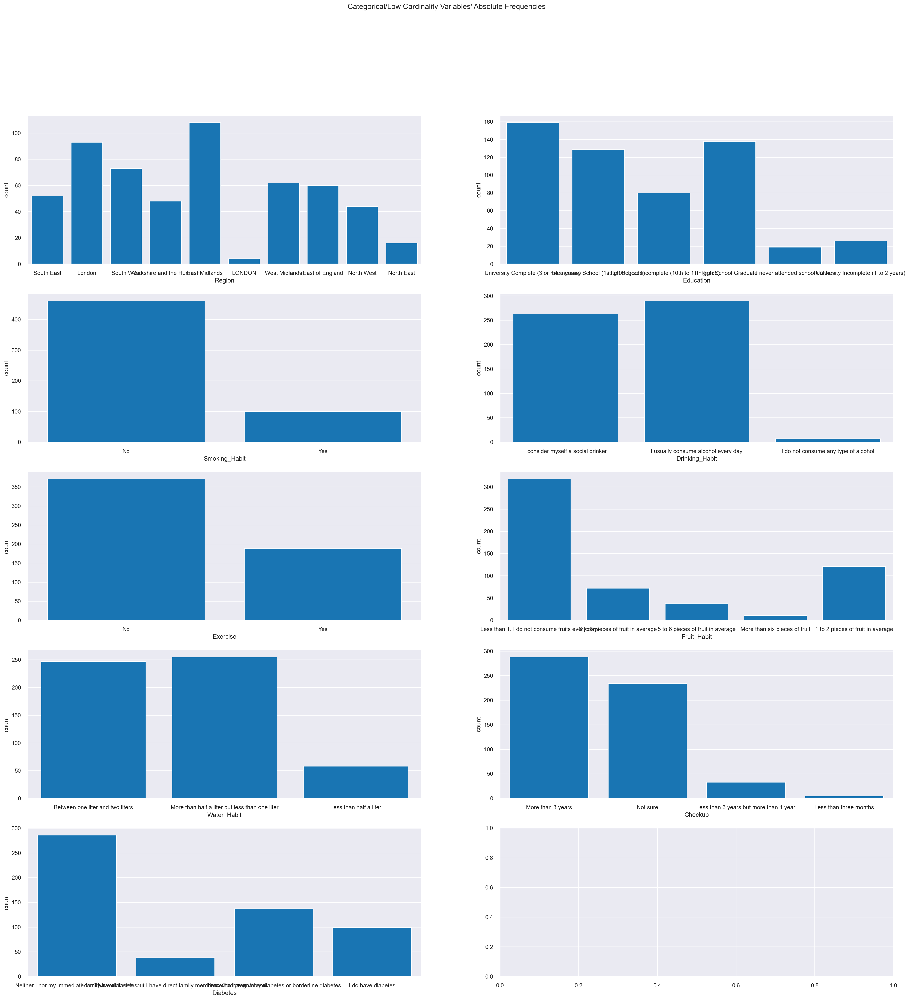

In [41]:
#Train
# All Non-Metric Variables' Absolute Frequencies  
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(5, 2, figsize=(30, 30))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
   sns.countplot(x=train_data[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'categorical_variables_frequecies.png'), dpi=200)
plt.show()

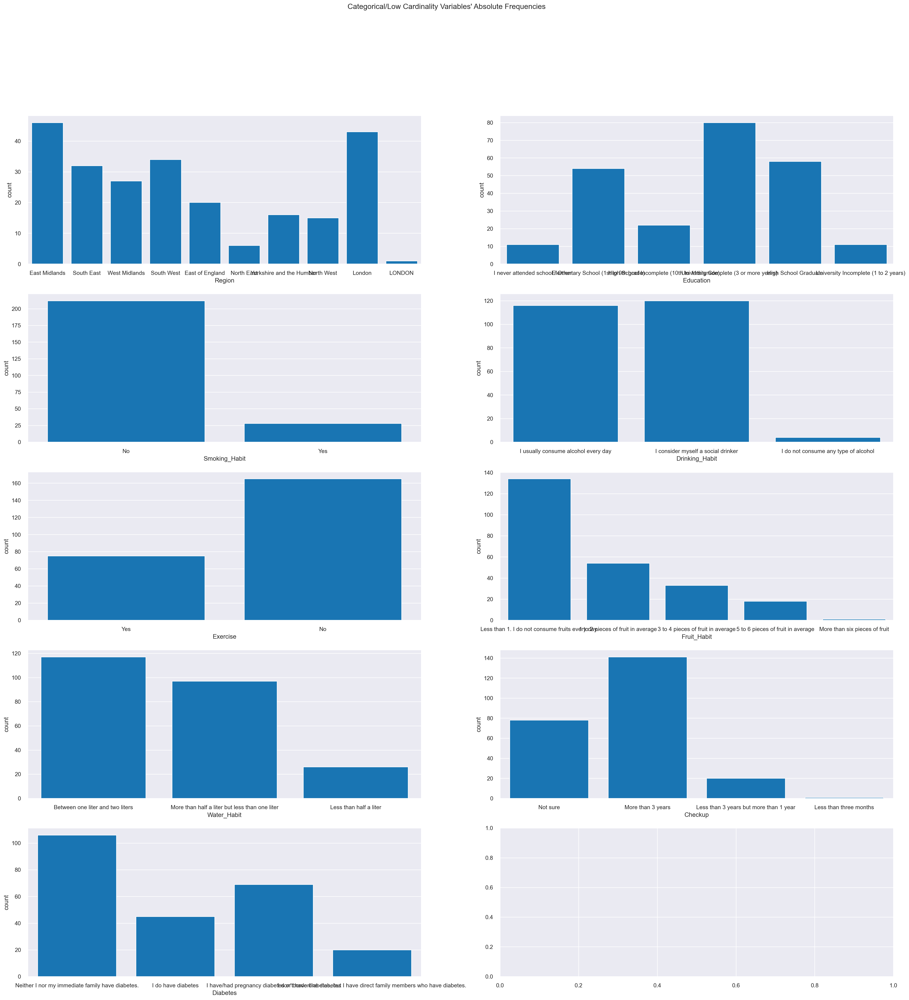

In [42]:
#Validation
#All Non-Metric Variables' Absolute Frequencies  
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(5, 2, figsize=(30, 30))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
   sns.countplot(x=val_data[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'categorical_variables_frequecies.png'), dpi=200)
plt.show()

##### Box Plots 

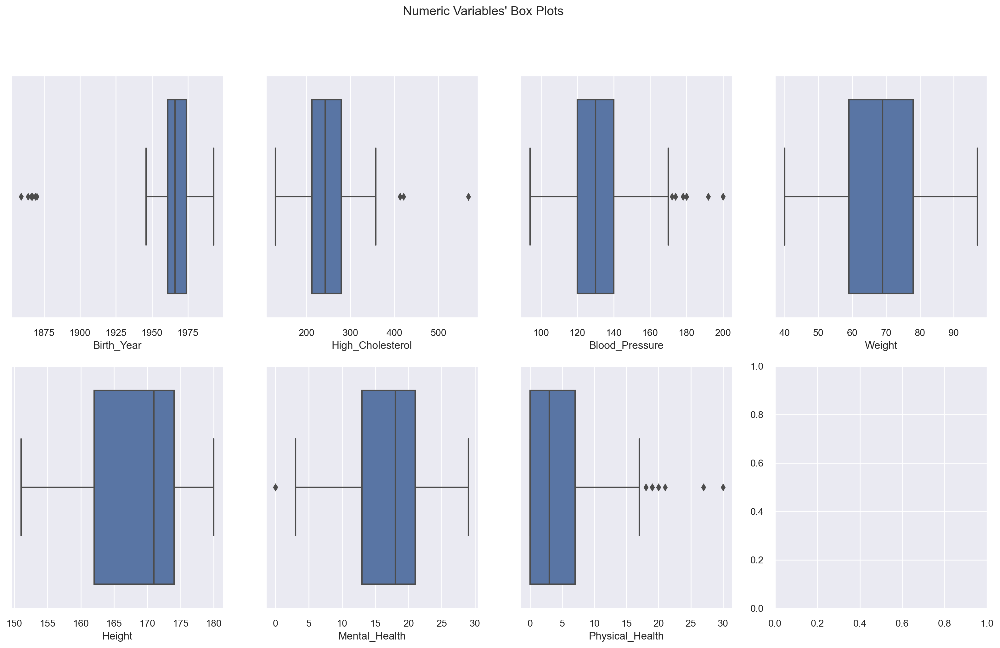

In [43]:
#Train
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
   sns.boxplot(x=train_data[feat], ax=ax)
   
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'numeric_variables_boxplots.png'), dpi=200)
plt.show()

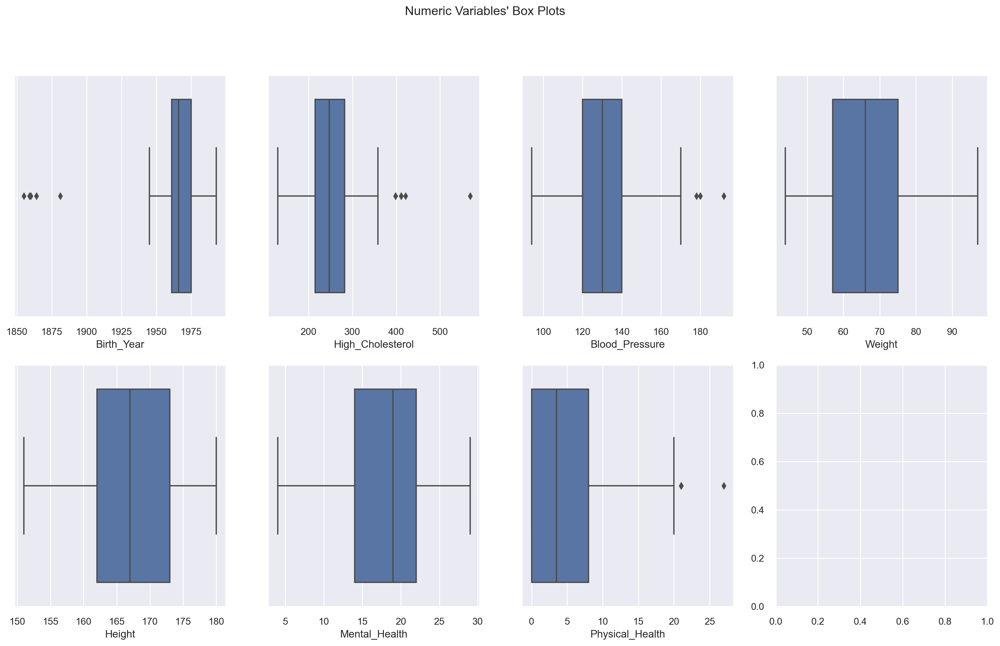

In [44]:
#Validation
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
   sns.boxplot(x=val_data[feat], ax=ax)
   
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'numeric_variables_boxplots.png'), dpi=200)
plt.show()

##### Pairwise Relationship

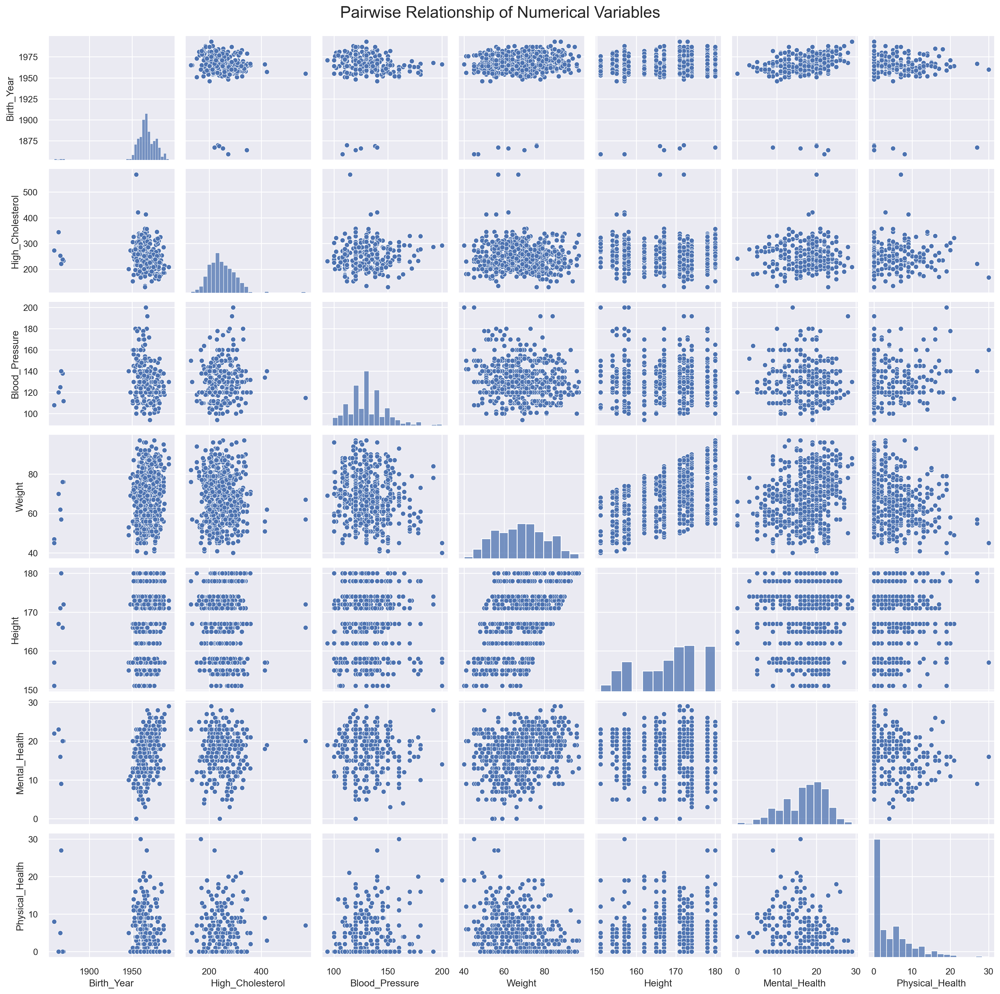

In [45]:
#Train
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(train_data[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

#plt.savefig(os.path.join('..', 'figures', 'pairwise_relationship_of_numerical_variables.png'), dpi=200)
plt.show()

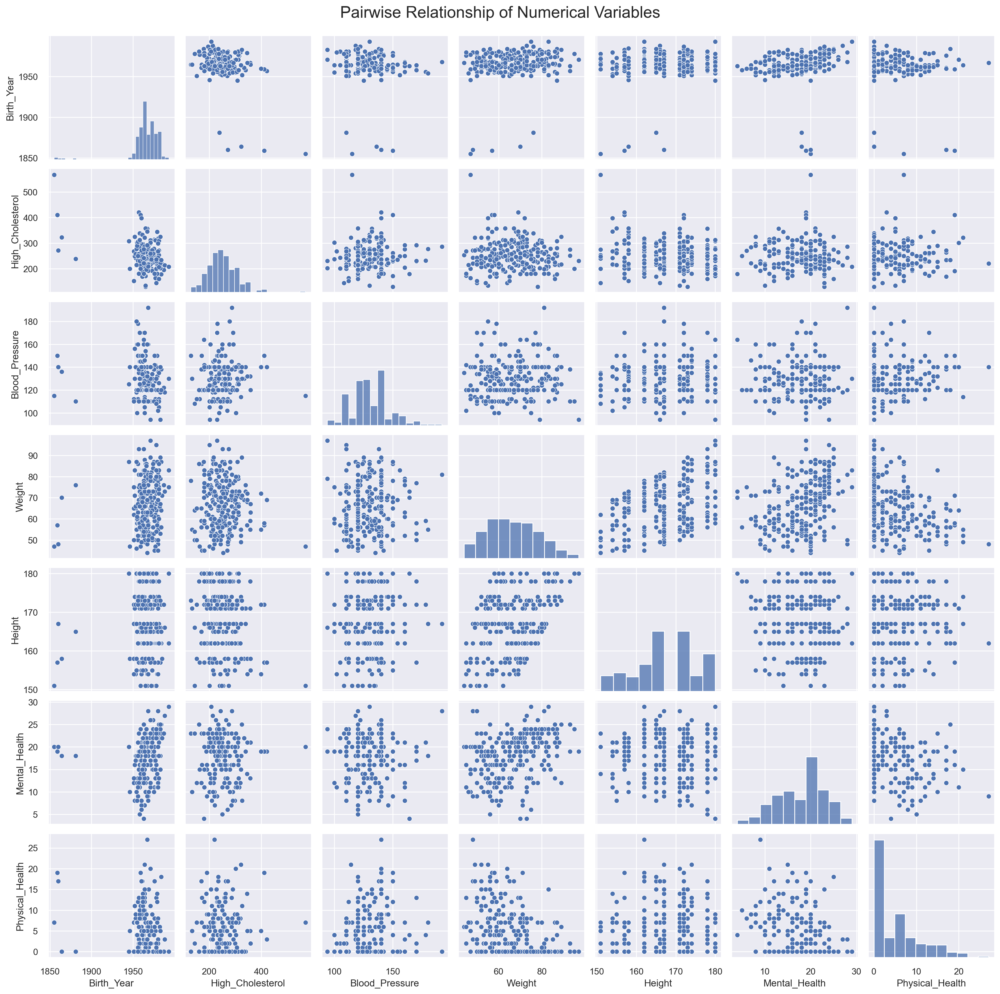

In [46]:
#Validation
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(val_data[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

#plt.savefig(os.path.join('..', 'figures', 'pairwise_relationship_of_numerical_variables.png'), dpi=200)
plt.show()

### Test

#### Check Missing Values 

In [47]:
# replace "" by nans
test.replace("", np.nan, inplace=True)

# count of missing values
test.isna().sum()

Name                0
Birth_Year          0
Region              0
Education           0
Smoking_Habit       0
Drinking_Habit      0
Exercise            0
Fruit_Habit         0
Water_Habit         0
Height              0
Weight              0
High_Cholesterol    0
Blood_Pressure      0
Mental_Health       0
Physical_Health     0
Checkup             0
Diabetes            0
dtype: int64

#### Check Duplicates 

In [48]:
# duplicated observations
test.duplicated().sum()

0

#### Check Data Types

In [49]:
# dataset data types
test.dtypes

Name                object
Birth_Year           int64
Region              object
Education           object
Smoking_Habit       object
Drinking_Habit      object
Exercise            object
Fruit_Habit         object
Water_Habit         object
Height               int64
Weight               int64
High_Cholesterol     int64
Blood_Pressure       int64
Mental_Health        int64
Physical_Health      int64
Checkup             object
Diabetes            object
dtype: object

#### Check Unique Values  

In [50]:
# Train
test['Region'].unique()

array(['East Midlands', 'Yorkshire and the Humber', 'West Midlands',
       'North East', 'South West', 'London', 'South East',
       'East of England', 'North West'], dtype=object)

#### Descriptive statistics 

##### Profile Report

In [51]:
#test_data.profile_report()

##### Describe Method

In [52]:
# Get the main descriptive statistics 
test.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Name,225,224,Mr. Michael Williams,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Birth_Year,225.0,NaN,NaN,NaN,1967.644444,9.438607,1945.0,1961.0,1967.0,1975.0,1988.0
Region,225,9,London,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,225,6,University Complete (3 or more years),92,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Smoking_Habit,225,2,No,199,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Drinking_Habit,225,3,I consider myself a social drinker,114,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Exercise,225,2,No,144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fruit_Habit,225,5,Less than 1. I do not consume fruits every day.,126,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Water_Habit,225,3,Between one liter and two liters,112,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Height,225.0,NaN,NaN,NaN,167.422222,8.014743,151.0,162.0,167.0,173.0,180.0


#### Visualizations

##### Absolute Frequencies

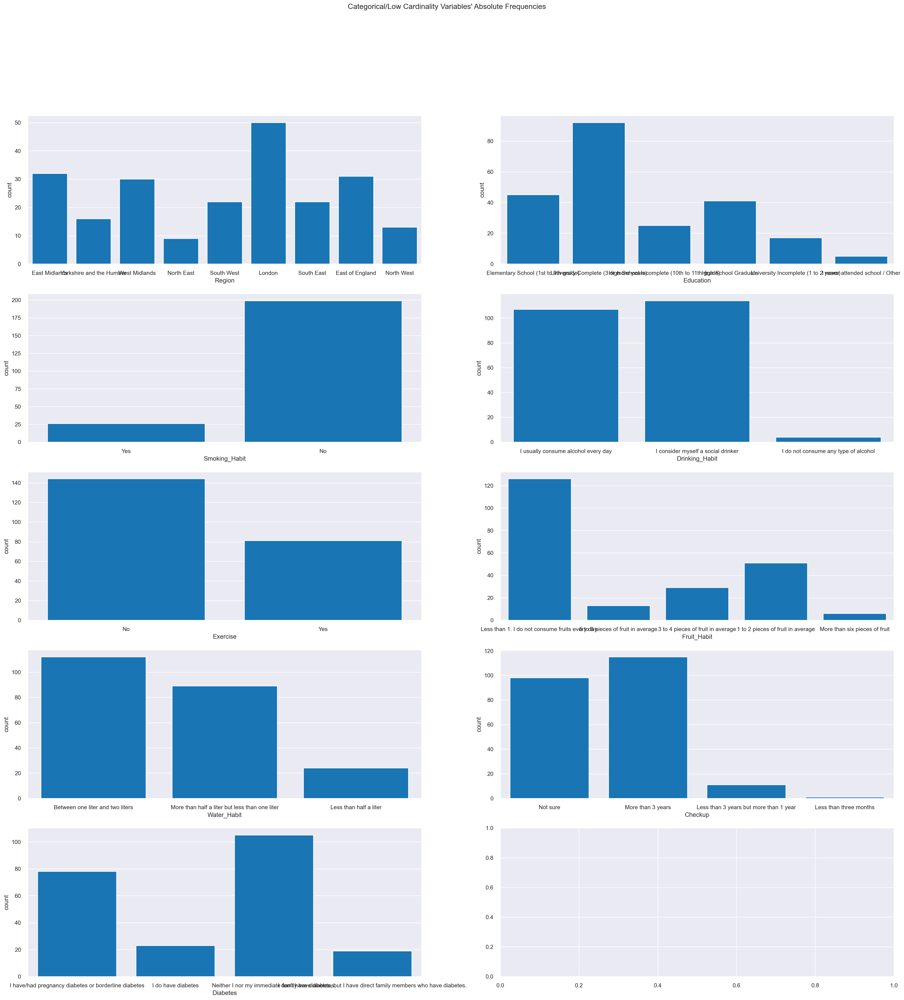

In [53]:
#Train
# All Non-Metric Variables' Absolute Frequencies  
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(5, 2, figsize=(30, 30))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
   sns.countplot(x=test[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'categorical_variables_frequecies.png'), dpi=200)
plt.show()

##### Box Plots 

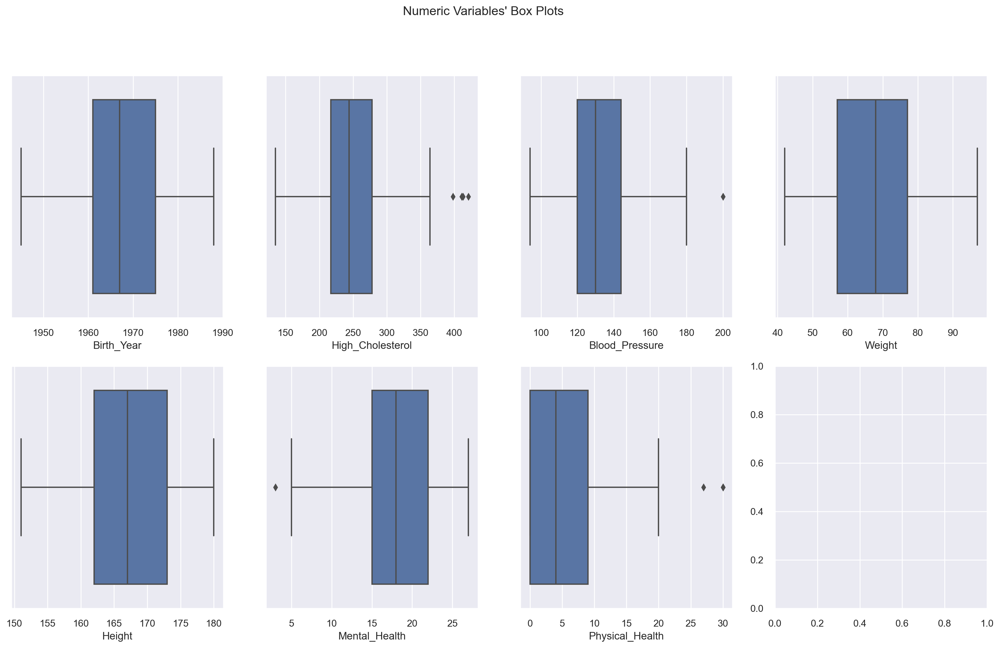

In [54]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
   sns.boxplot(x=test[feat], ax=ax)
   
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'numeric_variables_boxplots.png'), dpi=200)
plt.show()

##### Pairwise Relationship

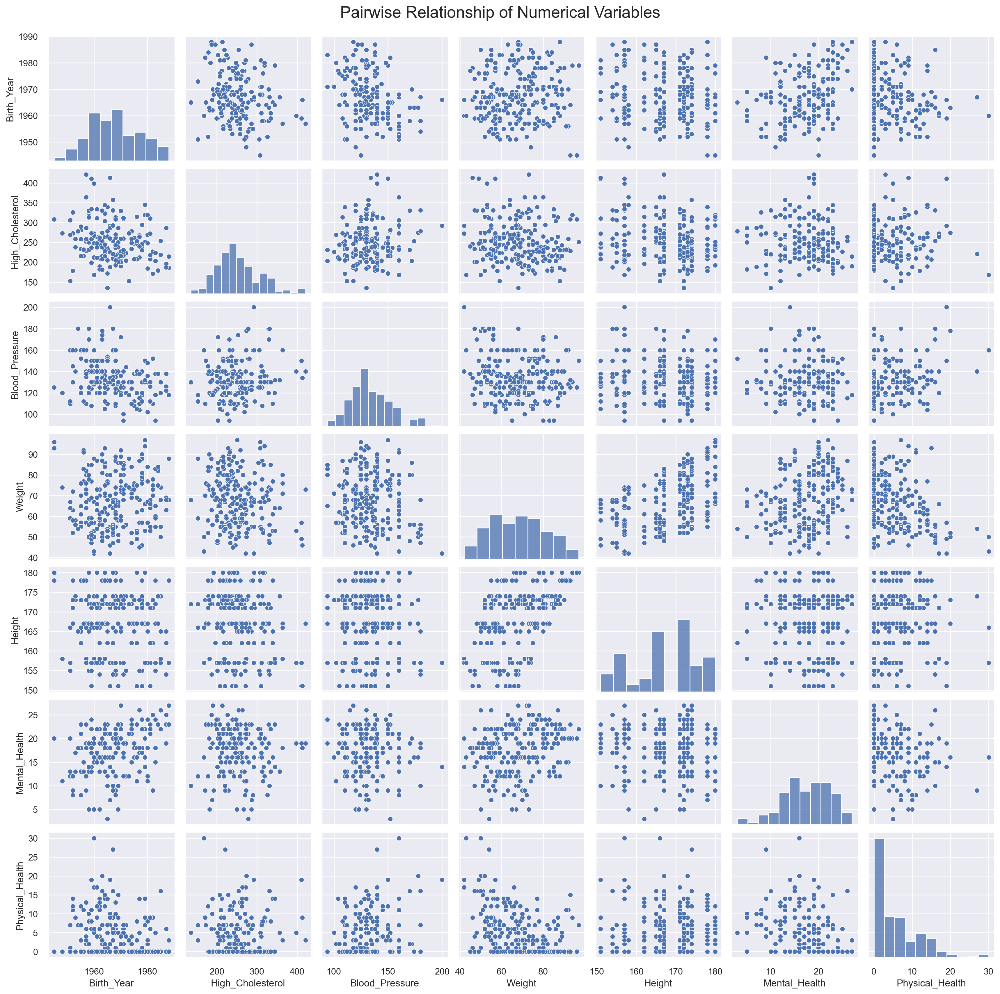

In [55]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(test[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

#plt.savefig(os.path.join('..', 'figures', 'pairwise_relationship_of_numerical_variables.png'), dpi=200)
plt.show()

## 5. Data Preprocessing

Includes all the needed steps to transform the raw data into
the data prepared to model. Involves all the steps for cleaning, transform and
reduce the dataset. It also involves the creation of new variables (if any) from
the original input features and the explanation of those. If new variables are
created, those should be mentioned and described clearly on a table (to be
included in the annexes)

### Data Cleaning

* Fix wrong dtypes
* Modes for non metric features
* Remove incoherences
* Remove outliers
* Descriptive statistics: boxplot, pairwise, barplot, histogram, min/max/std/var

#### Train and Validation

##### Drop Columns

In [56]:
train_clean = train_data.copy()
val_clean = val_data.copy()

In [57]:
# drop 'Name' 
train_clean.drop(columns=['Name'], inplace = True)
val_clean.drop(columns=['Name'], inplace = True)

##### Fix Wrong Data Types

In [58]:
#Train
train_clean[['Smoking_Habit']] = train_clean[['Smoking_Habit']] == 'Yes'

train_clean[['Exercise']] = train_clean[['Exercise']] == 'Yes'

In [59]:
#Validation
val_clean[['Smoking_Habit']] = val_clean[['Smoking_Habit']] == 'Yes'

val_clean[['Exercise']] = val_clean[['Exercise']] == 'Yes'

##### Fix data inconsistencies

In [60]:
# Train

In [61]:
# fix data inconsistency = "LONDON" and "London"

train_clean['Region'] = train_clean['Region'].str.title()
train_clean['Region'].unique()

array(['South East', 'London', 'South West', 'Yorkshire And The Humber',
       'East Midlands', 'West Midlands', 'East Of England', 'North West',
       'North East'], dtype=object)

In [62]:
# fix data inconsistency = "LONDON" and "London"

val_clean['Region'] = val_clean['Region'].str.title()
val_clean['Region'].unique()

array(['East Midlands', 'South East', 'West Midlands', 'South West',
       'East Of England', 'North East', 'Yorkshire And The Humber',
       'North West', 'London'], dtype=object)

##### Fill Missing Values

In [63]:
# Train

In [64]:
# Creating a copy to apply central tendency measures imputation
train_central = train_clean.copy()

In [65]:
# non metric features - mode
modes_train = train_central[non_metric_features].mode().loc[0]
modes_train

Region                                               East Midlands
Education                    University Complete (3 or more years)
Smoking_Habit                                                False
Drinking_Habit                 I usually consume alcohol every day
Exercise                                                     False
Fruit_Habit        Less than 1. I do not consume fruits every day.
Water_Habit         More than half a liter but less than one liter
Checkup                                          More than 3 years
Diabetes          Neither I nor my immediate family have diabetes.
Name: 0, dtype: object

In [66]:
# Fill missing values on train with modes_train 
train_central.fillna(modes_train, inplace=True)
train_central.isna().sum()  # checking how many NaNs we still have

Birth_Year          0
Region              0
Education           0
Disease             0
Smoking_Habit       0
Drinking_Habit      0
Exercise            0
Fruit_Habit         0
Water_Habit         0
Height              0
Weight              0
High_Cholesterol    0
Blood_Pressure      0
Mental_Health       0
Physical_Health     0
Checkup             0
Diabetes            0
dtype: int64

In [67]:
# val  

In [68]:
# Creating a copy to apply central tendency measures imputation
val_central = val_clean.copy()

In [69]:
# Fill missing values on val with modes_train (attention: don't use any modes_val to fill val)
val_central.fillna(modes_train, inplace=True)
val_central.isna().sum()  # checking how many NaNs we still have

Birth_Year          0
Region              0
Education           0
Disease             0
Smoking_Habit       0
Drinking_Habit      0
Exercise            0
Fruit_Habit         0
Water_Habit         0
Height              0
Weight              0
High_Cholesterol    0
Blood_Pressure      0
Mental_Health       0
Physical_Health     0
Checkup             0
Diabetes            0
dtype: int64

#### Outlier removal

##### Manual Filters

In [70]:
# Train
train_filters = train_central.copy()

filters = (
    (train_central['Birth_Year']>=1900) # need to assume the year of dataset colection
    &
    (train_central['High_Cholesterol']<=400)  # check what is the max value cholesterol for an alive person
    &
    (train_central['Blood_Pressure']<=200)   # check what is the max value Blood_Pressure for an alive person

)

train_filters = train_central[filters]

print('Percentage of data kept after removing outliers:', np.round(train_filters.shape[0] / train_central.shape[0], 4))

Percentage of data kept after removing outliers: 0.9786


In [71]:
# Validation

val_filters = val_central.copy()

filters = (
    (val_central['Birth_Year']>=1900) # need to assume the year of dataset colection
    &
    (val_central['High_Cholesterol']<=400)  # check what is the max value cholesterol for an alive person
    &
    (val_central['Blood_Pressure']<=200)   # check what is the max value Blood_Pressure for an alive person
    
)

val_filters = val_central[filters]

print('Percentage of data kept after removing outliers:', np.round(val_filters.shape[0] / val_central.shape[0], 4))

Percentage of data kept after removing outliers: 0.9708


##### LocalOutlierFactor

In [72]:
#Train
train_loc_outl = train_central.copy()

lof = LocalOutlierFactor(n_jobs=-1)
yhat = lof.fit_predict(train_loc_outl[metric_features].values)

# select all rows that are not outliers
mask = yhat != -1

outliers = train_loc_outl.iloc[~mask, :].copy()

# variable that contains the original number of observations:
original_observation = train_central.shape[0]
train_loc_outl = train_loc_outl.drop(index=outliers.index)

print('Percentage of data kept after removing outliers:', np.round(train_loc_outl.shape[0] / original_observation, 4))

Percentage of data kept after removing outliers: 0.9589


In [73]:
#Validation
val_loc_outl = val_central.copy()

lof = LocalOutlierFactor(n_jobs=-1)
yhat = lof.fit_predict(val_loc_outl[metric_features].values)

# select all rows that are not outliers
mask = yhat != -1

outliers = val_loc_outl.iloc[~mask, :].copy()

# variable that contains the original number of observations:
original_observation = val_central.shape[0]
val_loc_outl = val_loc_outl.drop(index=outliers.index)

print('Percentage of data kept after removing outliers:', np.round(val_loc_outl.shape[0] / original_observation, 4))

Percentage of data kept after removing outliers: 0.9583


##### IQR method

In [74]:
# Train
train_iqr = train_central.copy()

q25 = train_central[metric_features].quantile(.25)
q75 = train_central[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(train_central[metric].between(llim, ulim, inclusive='both'))

train_iqr = train_central[np.all(filters, 0)]

print('Percentage of data kept after removing outliers:', np.round(train_iqr.shape[0] / train_central.shape[0], 4))

Percentage of data kept after removing outliers: 0.925


In [75]:
# Validation

val_iqr = val_central.copy()

q25 = val_central[metric_features].quantile(.25)
q75 = val_central[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(val_central[metric].between(llim, ulim, inclusive='both'))

val_iqr = val_central[np.all(filters, 0)]

print('Percentage of data kept after removing outliers:', np.round(val_iqr.shape[0] / val_central.shape[0], 4))

Percentage of data kept after removing outliers: 0.9333


##### Combining different outlier removal methods

###### LocalOutlierFactor + Manual Filters

In [76]:
#Train
train_loc_outl_filters = train_filters.copy()

lof = LocalOutlierFactor(n_jobs=-1)
yhat = lof.fit_predict(train_loc_outl_filters[metric_features].values)

# select all rows that are not outliers
mask = yhat != -1
outliers = train_loc_outl_filters.iloc[~mask, :].copy()

# variable that contains the original number of observations:
original_observation = train_central.shape[0]
train_loc_outl_filters = train_loc_outl_filters.drop(index=outliers.index)

print('Percentage of data kept after removing outliers:', np.round(train_loc_outl_filters.shape[0] / original_observation, 4))

Percentage of data kept after removing outliers: 0.9589


In [77]:
#Validation
val_loc_outl_filters = val_filters.copy()

lof = LocalOutlierFactor(n_jobs=-1)
yhat = lof.fit_predict(val_loc_outl_filters[metric_features].values)

# select all rows that are not outliers
mask = yhat != -1
outliers = val_loc_outl_filters.iloc[~mask, :].copy()

# variable that contains the original number of observations:
original_observation = val_central.shape[0]
val_loc_outl_filters = val_loc_outl_filters.drop(index=outliers.index)

print('Percentage of data kept after removing outliers:', np.round(val_loc_outl_filters.shape[0] / original_observation, 4))

Percentage of data kept after removing outliers: 0.9583


###### IQR + Manual Filters

In [78]:
#Train
train_iqr_filters = train_filters.copy()

q25 = train_iqr_filters[metric_features].quantile(.25)
q75 = train_iqr_filters[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(train_iqr_filters[metric].between(llim, ulim, inclusive='both'))

train_iqr_filters = train_iqr_filters[np.all(filters, 0)]

print('Percentage of data kept after removing outliers:', np.round(train_iqr_filters.shape[0] / train_central.shape[0], 4))

Percentage of data kept after removing outliers: 0.925


In [79]:
#Validation
val_iqr_filters = val_filters.copy()

q25 = val_iqr_filters[metric_features].quantile(.25)
q75 = val_iqr_filters[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(val_iqr_filters[metric].between(llim, ulim, inclusive='both'))

val_iqr_filters = val_iqr_filters[np.all(filters, 0)]

print('Percentage of data kept after removing outliers:', np.round(val_iqr_filters.shape[0] / val_central.shape[0], 4))

Percentage of data kept after removing outliers: 0.9333


###### Final Outlier Removal

In [80]:
train = train_loc_outl_filters
val = val_loc_outl_filters

### Test

#### Drop Columns

In [81]:
test_clean = test.copy()

In [82]:
# drop 'Name' 
test_clean.drop(columns=['Name'], inplace = True)

#### Fix Wrong Data Types

In [83]:
#Test
test_clean[['Smoking_Habit']] = test_clean[['Smoking_Habit']] == 'Yes'

test_clean[['Exercise']] = test_clean[['Exercise']] == 'Yes'

In [84]:
test = test_clean

### Feature Selection and Engineering 

* split numerical and categorical
* Data normalization

#### Split numerical and categorical

In [85]:
# train
train_num = train[metric_features]
train_cat = train[non_metric_features]

# validation
val_num = val[metric_features]
val_cat = val[non_metric_features]

#test
test_num = test[metric_features]
test_cat = test[non_metric_features]



#### Data normalization

MinMaxScaler

In [86]:
# MinMaxScaler
# create scaler using train data set
scaler = MinMaxScaler().fit(train_num)

train_scaled = scaler.transform(train_num) # this will return an array
# Convert the array to a pandas dataframe
train_scaled = pd.DataFrame(train_scaled, columns = train_num.columns).set_index(train.index)
train_scaled.head(3)

,Birth_Year,High_Cholesterol,Blood_Pressure,Weight,Height,Mental_Health,Physical_Health
PatientID,,,,,,,
1262,0.595745,0.408072,0.285714,0.535714,0.482759,0.896552,0.000000
1532,0.276596,0.295964,0.306122,0.250000,0.206897,0.482759,0.000000
1350,0.212766,0.766816,0.265306,0.285714,0.793103,0.620690,0.037037


In [87]:
# use scaler of the training dataset to scale also the validation dataset (don't create any scaler with val to scale validation dataset)
val_scaled = scaler.transform(val_num)
val_scaled = pd.DataFrame(val_scaled, columns = val_num.columns).set_index(val.index)
val_scaled.head(3)

,Birth_Year,High_Cholesterol,Blood_Pressure,Weight,Height,Mental_Health,Physical_Health
PatientID,,,,,,,
1894,0.531915,0.753363,0.469388,0.571429,0.37931,0.793103,0.259259
1660,0.319149,0.156951,0.448980,0.428571,0.37931,0.413793,0.629630
1060,1.000000,0.327354,0.367347,0.750000,1.00000,1.000000,0.000000


In [88]:
# use scaler of the training dataset to scale also the validation dataset (don't create any scaler with val to scale validation dataset)
test_scaled = scaler.transform(test_num)
test_scaled = pd.DataFrame(test_scaled, columns = test_num.columns).set_index(test.index)
test_scaled.head(3)

,Birth_Year,High_Cholesterol,Blood_Pressure,Weight,Height,Mental_Health,Physical_Health
PatientID,,,,,,,
1343,0.510638,0.304933,0.795918,0.696429,0.724138,0.689655,0.074074
1727,0.425532,0.403587,0.367347,0.696429,0.689655,0.724138,0.000000
1828,0.680851,0.457399,0.367347,0.660714,0.689655,0.827586,0.037037


#### Split X and Y 

In [89]:
# train

In [90]:
# use selected outliers removal
X_train = train_scaled
y_train = train['Disease']

In [91]:
# val

In [92]:
# use selected outliers removal
X_val = val_scaled
y_val = val['Disease']

#### Filter methods

##### Univariate variables

In [93]:
# Check if any of the numerical variables is univariate (variance is equal to 0). Drop those variables if existent.
train_scaled.var()

Birth_Year          0.036487
High_Cholesterol    0.037180
Blood_Pressure      0.027382
Weight              0.046751
Height              0.076220
Mental_Health       0.036295
Physical_Health     0.033299
dtype: float64

Insight: variables variance is not equal to 0. We are not going to drop any variable based on "variance equal to 0". 

In [94]:
# create a new dataframe with all the scaled training data, but containing also the dependent variable
all_train = train_scaled.join(y_train)
all_train.head(1)

,Birth_Year,High_Cholesterol,Blood_Pressure,Weight,Height,Mental_Health,Physical_Health,Disease
PatientID,,,,,,,,
1262,0.595745,0.408072,0.285714,0.535714,0.482759,0.896552,0.0,1


##### Spearman Correlation

In [95]:
#Create a function to plot the correlation between the variables named `cor_heatmap()
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

In [96]:
# Check the spearman correlation of the __all_train__ dataset by applying the method `corr()` 
# and assign it to the object `cor_spearman`
cor_spearman = all_train.corr(method ='spearman')
cor_spearman

,Birth_Year,High_Cholesterol,Blood_Pressure,Weight,Height,Mental_Health,Physical_Health,Disease
Birth_Year,1.000000,-0.229738,-0.310202,0.165660,0.112359,0.383425,-0.194274,0.205551
High_Cholesterol,-0.229738,1.000000,0.151900,-0.005005,0.004163,-0.027476,-0.013501,-0.097207
Blood_Pressure,-0.310202,0.151900,1.000000,-0.096331,-0.018868,-0.021505,0.118943,-0.103736
Weight,0.165660,-0.005005,-0.096331,1.000000,0.508532,0.316771,-0.361096,0.149938
Height,0.112359,0.004163,-0.018868,0.508532,1.000000,-0.042363,0.118220,-0.178372
Mental_Health,0.383425,-0.027476,-0.021505,0.316771,-0.042363,1.000000,-0.423744,0.453918
Physical_Health,-0.194274,-0.013501,0.118943,-0.361096,0.118220,-0.423744,1.000000,-0.409254
Disease,0.205551,-0.097207,-0.103736,0.149938,-0.178372,0.453918,-0.409254,1.000000


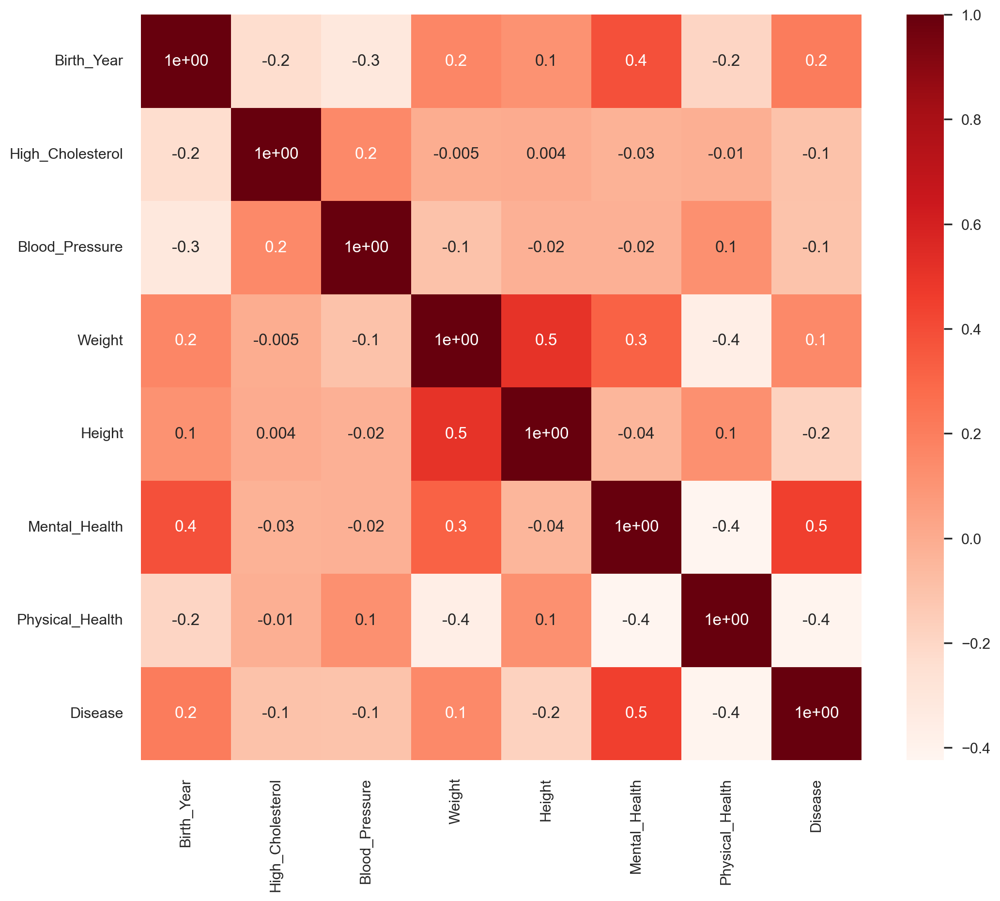

In [97]:
#Call the function `cor_heatmap()` to the correlation table `cor_spearman`
cor_heatmap(cor_spearman)

Independent variables are not highly correlated with the target, based on this we would drop all of the variables.


##### Chi-Square for categorical data

In [98]:
# Create a function named as `TestIndependence
# chi-square to check if a independent variable is an important predictor

def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [99]:
# call the function `TestIndependence`
# categorical variables available on `train_cat`
for var in train_cat:
    TestIndependence(train_cat[var],y_train, var)

Region is NOT an important predictor. (Discard Region from model)
Education is NOT an important predictor. (Discard Education from model)
Smoking_Habit is NOT an important predictor. (Discard Smoking_Habit from model)
Drinking_Habit is IMPORTANT for Prediction
Exercise is IMPORTANT for Prediction
Fruit_Habit is IMPORTANT for Prediction
Water_Habit is NOT an important predictor. (Discard Water_Habit from model)
Checkup is IMPORTANT for Prediction
Diabetes is IMPORTANT for Prediction


According to chi-square, the categorical variables that we should keep for the final model are: `Drinking_Habit` , `Exercise` ,  `Fruit_Habit`, `Checkup` and `Diabetes` 

#### Visualize weight of depend. variable in categ. data

In [100]:
# Create function visualize proportion label dependent variable in each possible value of a categorical feature

In [101]:
# first join all the training data

def bar_charts_categorical(df, feature, target):
    cont_tab = pd.crosstab(df[feature], df[target], margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="gray")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.ylabel("$Frequency$")

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="gray")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.ylabel("$p$")

    plt.show()

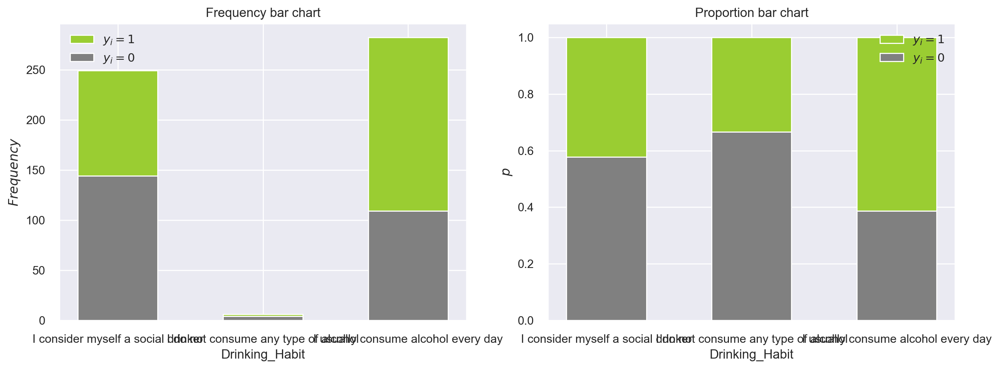

In [102]:
# Check the "weight" of the variable `Drinking_Habit`
bar_charts_categorical(train, "Drinking_Habit", "Disease")

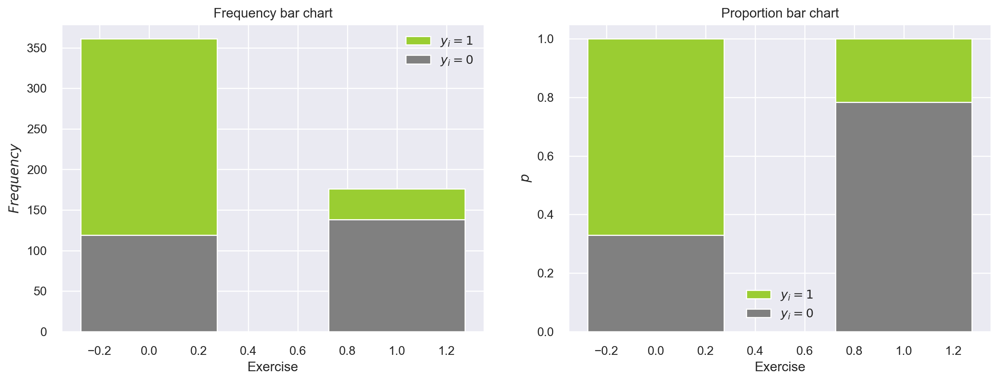

In [103]:
# Check the "weight" of the variable `Drinking_Habit`
bar_charts_categorical(train, "Exercise", "Disease")

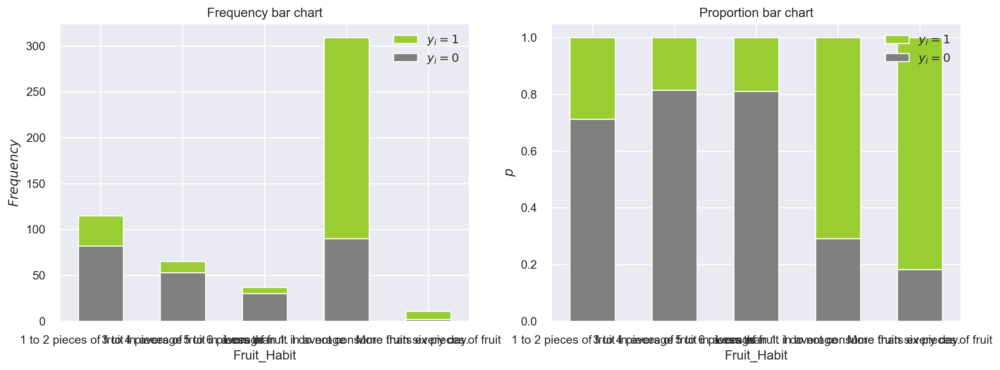

In [104]:
# Check the "weight" of the variable `Fruit_Habit`
bar_charts_categorical(train, "Fruit_Habit", "Disease")

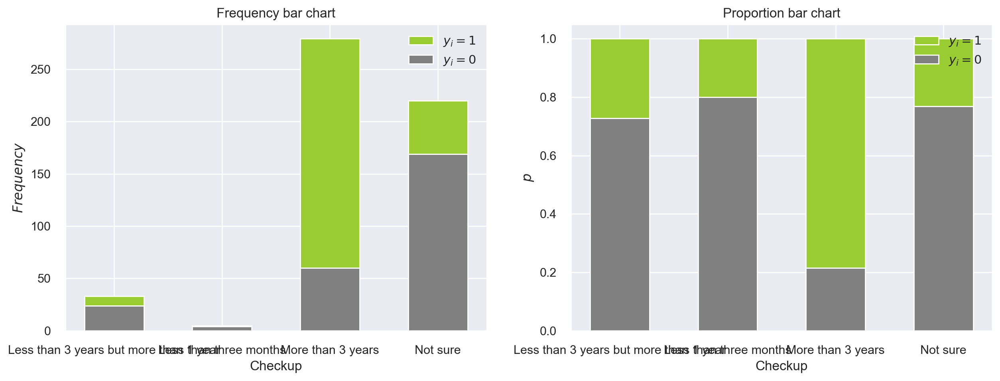

In [105]:
# Check the "weight" of the variable `Checkup`
bar_charts_categorical(train, "Checkup", "Disease")

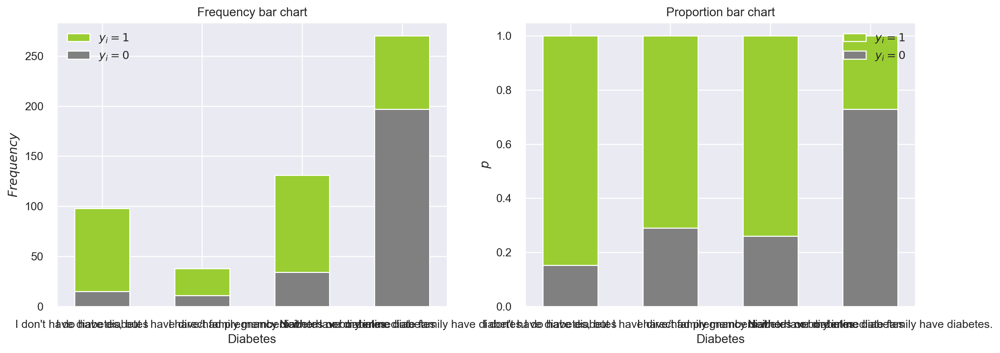

In [106]:
# Check the "weight" of the variable `Diabetes`
bar_charts_categorical(train, "Diabetes", "Disease")

#### Wrapper Methods

##### RFE - Recursive Feature Elimination

Don't know apriori number features to select so create loop to check score estimator using different number features check the score of the estimator by chosing between 1 and 7 variables.

In [107]:
#no of features
nof_list=list(range(1,8))
high_score=0
#Variable to store the optimum features
nof=0           
score_list =[]
for n in nof_list:
    #model = LogisticRegression()
    #model = RandomForestClassifier()
    model = DecisionTreeClassifier()
    rfe = RFE(estimator = model, n_features_to_select = n)
    train_rfe = rfe.fit_transform(train_scaled,y_train)
    val_rfe = rfe.transform(val_scaled)
    model.fit(train_rfe,y_train)
    
    score = model.score(val_rfe,y_val)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 4
Score with 4 features: 0.952174


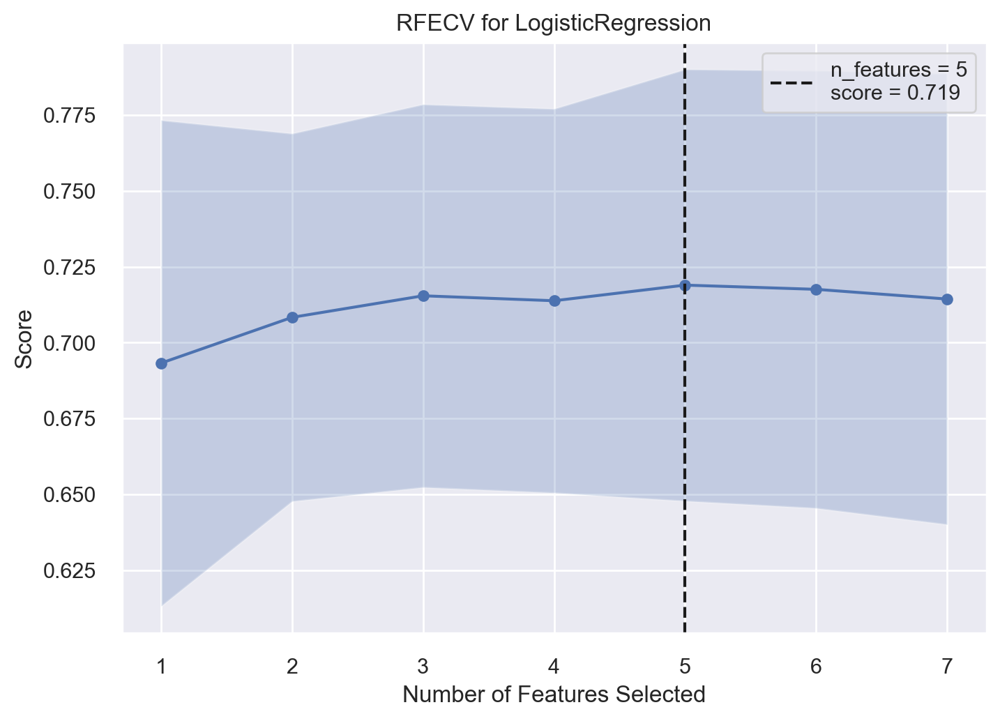

In [108]:
#Log Reg

X, y = train_scaled,y_train

# create pipeline
rfe = RFE(estimator=LogisticRegression(), n_features_to_select=5)
model = LogisticRegression()
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

visualizer = rfecv(LogisticRegression(), X=X, y=y, cv=cv, scoring='f1_weighted')

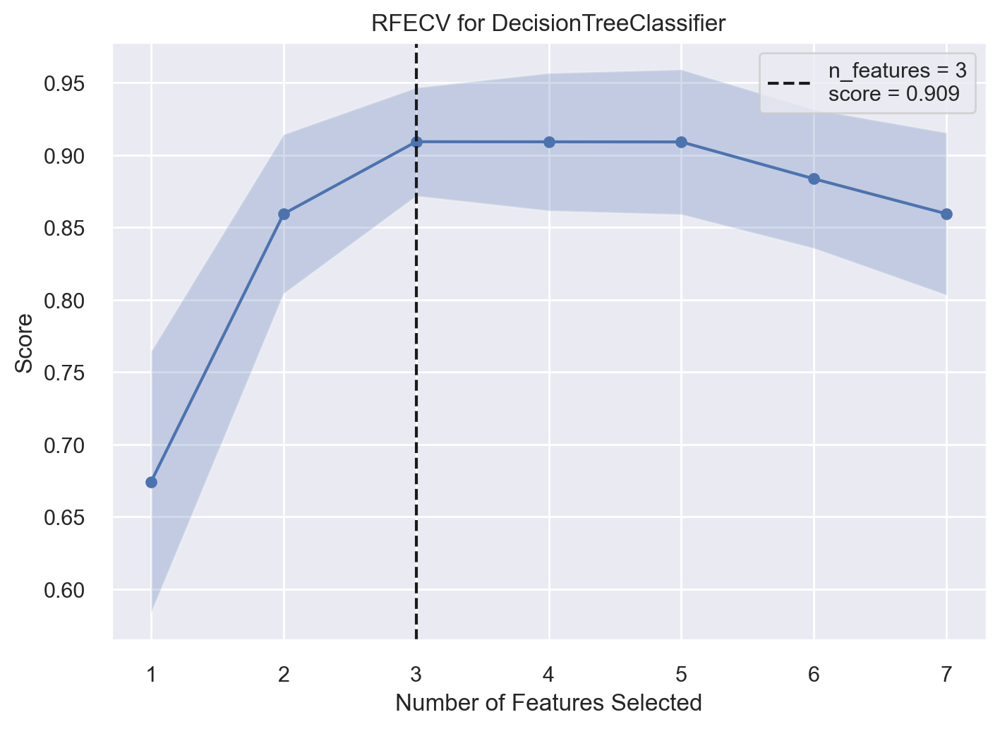

In [109]:
#Decision Tree

# create pipeline
rfe = RFE(estimator=DecisionTreeClassifier(), n_features_to_select=5)
model = DecisionTreeClassifier()
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

visualizer = rfecv(DecisionTreeClassifier(), X=X, y=y, cv=cv, scoring='f1_weighted')

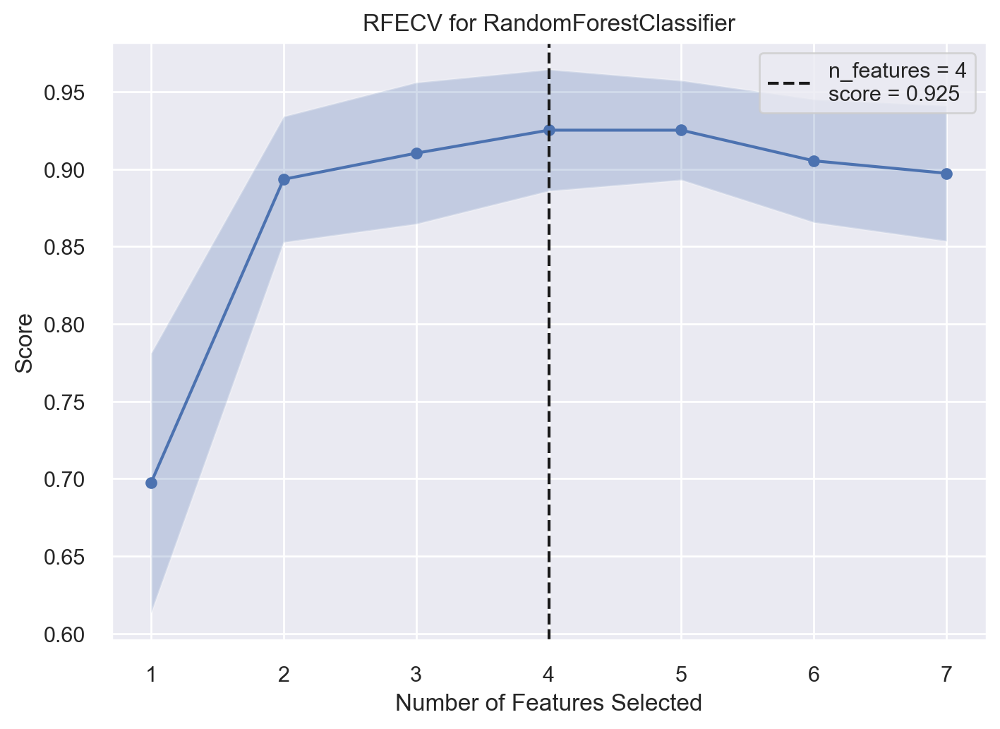

In [110]:
#Random Forest

# create pipeline
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=5)
model = RandomForestClassifier()
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

visualizer = rfecv(RandomForestClassifier(), X=X, y=y, cv=cv, scoring='f1_weighted')

Taking into account the results of RFE, we are unsure whether to keep 4 or 5 features, so we will try with both solutions.

In [111]:
rfe = RFE(estimator = model, n_features_to_select = 5)
X_rfe = rfe.fit_transform(X = train_scaled, y = y_train)
selected_features = pd.Series(rfe.support_, index = train_scaled.columns)
selected_features

Birth_Year           True
High_Cholesterol     True
Blood_Pressure       True
Weight              False
Height              False
Mental_Health        True
Physical_Health      True
dtype: bool

Insight: 
According to RFE, we should keep `Birth_Year`, `High_Cholesterol`, `Mental_Health`, and `Physical_Health`, and also try with `Blood_Pressure`.

#### Embedded Methods

##### Lasso Regression

In [112]:
# Create a function to plot the importance of the features named `plot_importance()` 

In [113]:
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()

In [114]:
# Using LassoCV, create a Lasso Regression instance called `reg`
reg = LassoCV()

# Fit the data to `reg` by using the method `fit()` where `X` should be assigned to `data` and `y` to the dependent variable
reg.fit(train_scaled, y_train)

# Create an object (pandas Series) named `coef` that will have as index the `data` columns names and the `coef_` attribute as value
coef = pd.Series(reg.coef_, index = train_scaled.columns)
coef.sort_values()

Physical_Health    -0.665160
Height             -0.266919
Blood_Pressure     -0.205986
High_Cholesterol   -0.145644
Birth_Year          0.000000
Weight              0.023462
Mental_Health       0.864301
dtype: float64

In [115]:
# Check how many variables did Lasso picked (if the coef is different from 0) and how many variables did Lasso eliminated (if the coef is equal to 0)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 6 variables and eliminated the other 1 variables


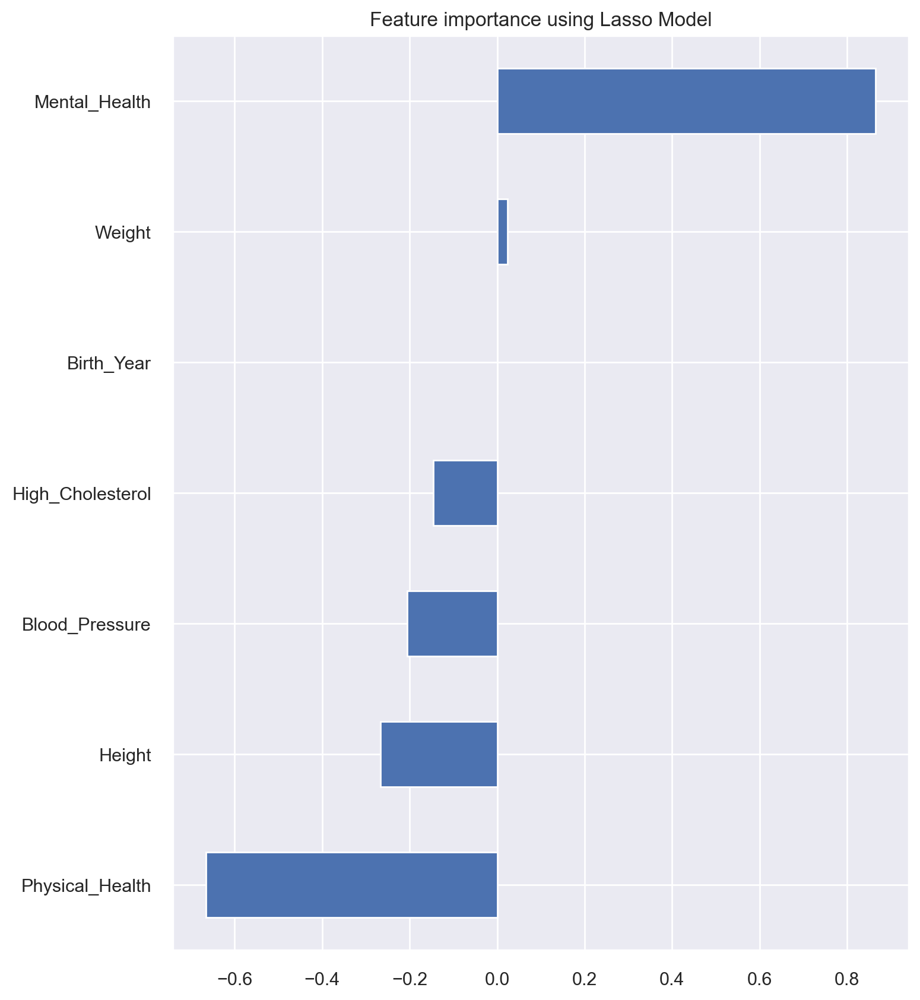

In [116]:
# By calling the function `plot_importance()` that we created on step 15, 
# plot the feature importance of the variables, by passing as parameters the object `coef` and the name `"Lasso"`
plot_importance(coef,'Lasso')

Insight:
According to Lasso, we should discard `Birth_Year`. Whilst `Weight`, `Height`, `High_Cholesterol` and `Blood_Pressure`  also seem insignificant for the definition of the target comparing to the remaining predictors.

#### Feature Selection Insights

Numerical Data  

| Predictor | Spearman | RFE | Lasso | What to do? (One possible way to "solve")
| --- | --- | --- | --- |--- |
| Birth_Year |  Discard  | Keep | Discard | Discard |
| Height |  Discard | Discard | Keep ? | Discard |
| Weight |  Discard | Discard | Keep ? |Discard |
| High_Cholesterol |  Discard | Keep | Keep ? | Try with and without |
| Blood_Pressure |  Discard  | Keep? | Keep ? |  Try with and without |
| Mental_Health |  Discard   | Keep | Keep | Include in the model |
| Physical_Health |  Discard | Keep | Keep |  Include in the model |


Categorical Data 

| Predictor | Chi-Square | 
| --- | --- | 
| Region | Discard | 
| Education | Discard | 
| Smoking_Habit | Discard |
| Drinking_Habit | Keep | 
| Exercise | Keep | 
| Fruit_Habit | Keep | 
| Water_Habit | Discard |
| Checkup | Keep | 
| Diabetes | Keep |

#### Final Datasets

In [117]:
# Trial 1: No Blood_Pressure
trial1 = ['Weight','Birth_Year', 'Height', 'Region', 'Education', 'Smoking_Habit', 'Water_Habit', 'Blood_Pressure']
# Trial 2: No High_Cholesterol
trial2 = ['Weight', 'High_Cholesterol', 'Birth_Year','Height','Region', 'Education', 'Smoking_Habit', 'Water_Habit']
# Trial 3: No Blood_Pressure or High_Cholesterol
trial3 = ['Weight','Birth_Year', 'Height', 'Region', 'Education', 'Smoking_Habit', 'Water_Habit', 'Blood_Pressure', 'High_Cholesterol']
# Trial 4: With Blood_Pressure and High_Cholesterol 
trial4 = ['Weight','Birth_Year', 'Height', 'Region', 'Education', 'Smoking_Habit', 'Water_Habit']


#Train
train_feat_trial1 = train.drop(columns = trial1)
train_feat_trial2 = train.drop(columns = trial2)
train_feat_trial3 = train.drop(columns = trial3)
train_feat_trial4 = train.drop(columns = trial4)

#Validation
val_feat_trial1 = val.drop(columns = trial1)
val_feat_trial2 = val.drop(columns = trial2)
val_feat_trial3 = val.drop(columns = trial3)
val_feat_trial4 = val.drop(columns = trial4)

#Test
test_feat_trial1 = test.drop(columns = trial1)
test_feat_trial2 = test.drop(columns = trial2)
test_feat_trial3 = test.drop(columns = trial3)
test_feat_trial4 = test.drop(columns = trial4)


#### Final Split Numerical and Categorical

In [118]:
non_metric_features = ['Drinking_Habit','Fruit_Habit','Checkup','Diabetes', 'Exercise']
metric_features_trial1 = ['Mental_Health', 'Physical_Health', 'High_Cholesterol']
metric_features_trial2 = ['Mental_Health', 'Physical_Health', 'Blood_Pressure']
metric_features_trial3 = ['Mental_Health', 'Physical_Health']
metric_features_trial4 = ['Mental_Health', 'Physical_Health', 'Blood_Pressure', 'High_Cholesterol']

#### One Hot Encoding

In [119]:
#Train
ohe_train= train[non_metric_features]

ohe = OneHotEncoder(sparse=False, drop="first")
ohe_feat = ohe.fit_transform(ohe_train)
ohe_feat_names = ohe.get_feature_names_out()
ohe_train = pd.DataFrame(ohe_feat, index=ohe_train.index, columns=ohe_feat_names)  


#Validation
ohe_val= val[non_metric_features]

ohe = OneHotEncoder(sparse=False, drop="first")
ohe_feat = ohe.fit_transform(ohe_val)
ohe_feat_names = ohe.get_feature_names_out()
ohe_val = pd.DataFrame(ohe_feat, index=ohe_val.index, columns=ohe_feat_names) 

#Test
ohe_test= test[non_metric_features]

ohe = OneHotEncoder(sparse=False, drop="first")
ohe_feat = ohe.fit_transform(ohe_test)
ohe_feat_names = ohe.get_feature_names_out()
ohe_test = pd.DataFrame(ohe_feat, index=ohe_test.index, columns=ohe_feat_names)

#### Final Split X and Y 

In [120]:
#Train
X_train_feat_trial1 = pd.concat([train_scaled[metric_features_trial1], ohe_train], axis=1)
X_train_feat_trial2 = pd.concat([train_scaled[metric_features_trial2], ohe_train], axis=1)
X_train_feat_trial3 = pd.concat([train_scaled[metric_features_trial3], ohe_train], axis=1)
X_train_feat_trial4 = pd.concat([train_scaled[metric_features_trial4], ohe_train], axis=1)
Y_train= train['Disease']

#Validation
X_val_feat_trial1 = pd.concat([val_scaled[metric_features_trial1], ohe_val], axis=1)
X_val_feat_trial2 = pd.concat([val_scaled[metric_features_trial2], ohe_val], axis=1)
X_val_feat_trial3 = pd.concat([val_scaled[metric_features_trial3], ohe_val], axis=1)
X_val_feat_trial4 = pd.concat([val_scaled[metric_features_trial4], ohe_val], axis=1)
Y_val= val['Disease']

#Test
test_trial1 = pd.concat([test_scaled[metric_features_trial1], ohe_test], axis=1)
test_trial2 = pd.concat([test_scaled[metric_features_trial2], ohe_test], axis=1)
test_trial3 = pd.concat([test_scaled[metric_features_trial3], ohe_test], axis=1)
test_trial4 = pd.concat([test_scaled[metric_features_trial4], ohe_test], axis=1)

## Redo Data Exploration

* Check Outliers
* Check Missing Values
* Descriptive statistics: boxplot, pairwise, barplot, histogram, min/max/std/var

### Profile Report

In [121]:
# Train Trial 4 - The one with all the variables
#train_feat_trial4.profile_report()

In [122]:
# Validation Trial 4
#val_feat_trial4.profile_report()

In [123]:
# Test Trial 4
#test_feat_trial4.profile_report()

### Descriptive Statistics 

In [124]:
# Train Trial 4
train_feat_trial4.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Disease,537.0,NaN,NaN,NaN,0.521415,0.500007,0.0,0.0,1.0,1.0,1.0
Drinking_Habit,537,3,I usually consume alcohol every day,282,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Exercise,537,2,False,361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fruit_Habit,537,5,Less than 1. I do not consume fruits every day.,309,NaN,NaN,NaN,NaN,NaN,NaN,NaN
High_Cholesterol,537.0,NaN,NaN,NaN,245.513966,42.999179,135.0,212.0,241.0,277.0,358.0
Blood_Pressure,537.0,NaN,NaN,NaN,130.424581,16.216653,94.0,120.0,130.0,140.0,192.0
Mental_Health,537.0,NaN,NaN,NaN,17.078212,5.524828,0.0,13.0,18.0,21.0,29.0
Physical_Health,537.0,NaN,NaN,NaN,4.080074,4.926996,0.0,0.0,2.0,7.0,27.0
Checkup,537,4,More than 3 years,279,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Diabetes,537,4,Neither I nor my immediate family have diabetes.,270,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
# Validation Trial 4
val_feat_trial4.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Disease,230.0,NaN,NaN,NaN,0.513043,0.50092,0.0,0.0,1.0,1.0,1.0
Drinking_Habit,230,3,I usually consume alcohol every day,115,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Exercise,230,2,False,155,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fruit_Habit,230,5,Less than 1. I do not consume fruits every day.,130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
High_Cholesterol,230.0,NaN,NaN,NaN,246.778261,47.830929,130.0,215.0,244.0,277.0,358.0
Blood_Pressure,230.0,NaN,NaN,NaN,130.221739,15.61766,94.0,120.0,130.0,140.0,180.0
Mental_Health,230.0,NaN,NaN,NaN,17.773913,5.173093,4.0,13.25,19.0,22.0,29.0
Physical_Health,230.0,NaN,NaN,NaN,5.056522,5.722195,0.0,0.0,3.0,8.0,27.0
Checkup,230,4,More than 3 years,135,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Diabetes,230,4,Neither I nor my immediate family have diabetes.,101,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
# Test Trial 4
test_feat_trial4.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Drinking_Habit,225,3,I consider myself a social drinker,114,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Exercise,225,2,False,144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fruit_Habit,225,5,Less than 1. I do not consume fruits every day.,126,NaN,NaN,NaN,NaN,NaN,NaN,NaN
High_Cholesterol,225.0,NaN,NaN,NaN,252.408889,51.72741,135.0,217.0,244.0,278.0,421.0
Blood_Pressure,225.0,NaN,NaN,NaN,133.595556,18.983098,94.0,120.0,130.0,144.0,200.0
Mental_Health,225.0,NaN,NaN,NaN,17.546667,4.902514,3.0,15.0,18.0,22.0,27.0
Physical_Health,225.0,NaN,NaN,NaN,5.377778,6.061032,0.0,0.0,4.0,9.0,30.0
Checkup,225,4,More than 3 years,115,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Diabetes,225,4,Neither I nor my immediate family have diabetes.,105,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Visualizations

#### Absolut Frequencies

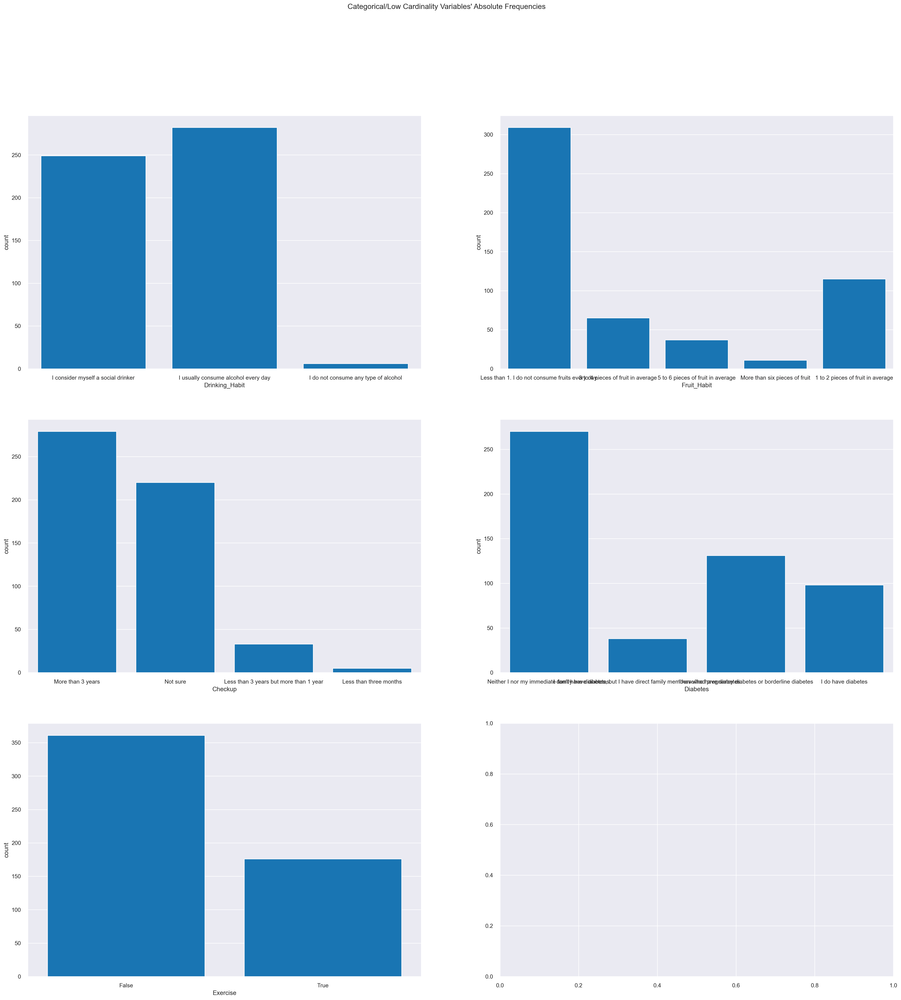

In [127]:
##Train4
# All Non-Metric Variables' Absolute Frequencies  
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, 2, figsize=(30, 30))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
   sns.countplot(x=train_feat_trial4[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'categorical_variables_frequecies.png'), dpi=200)
plt.show()

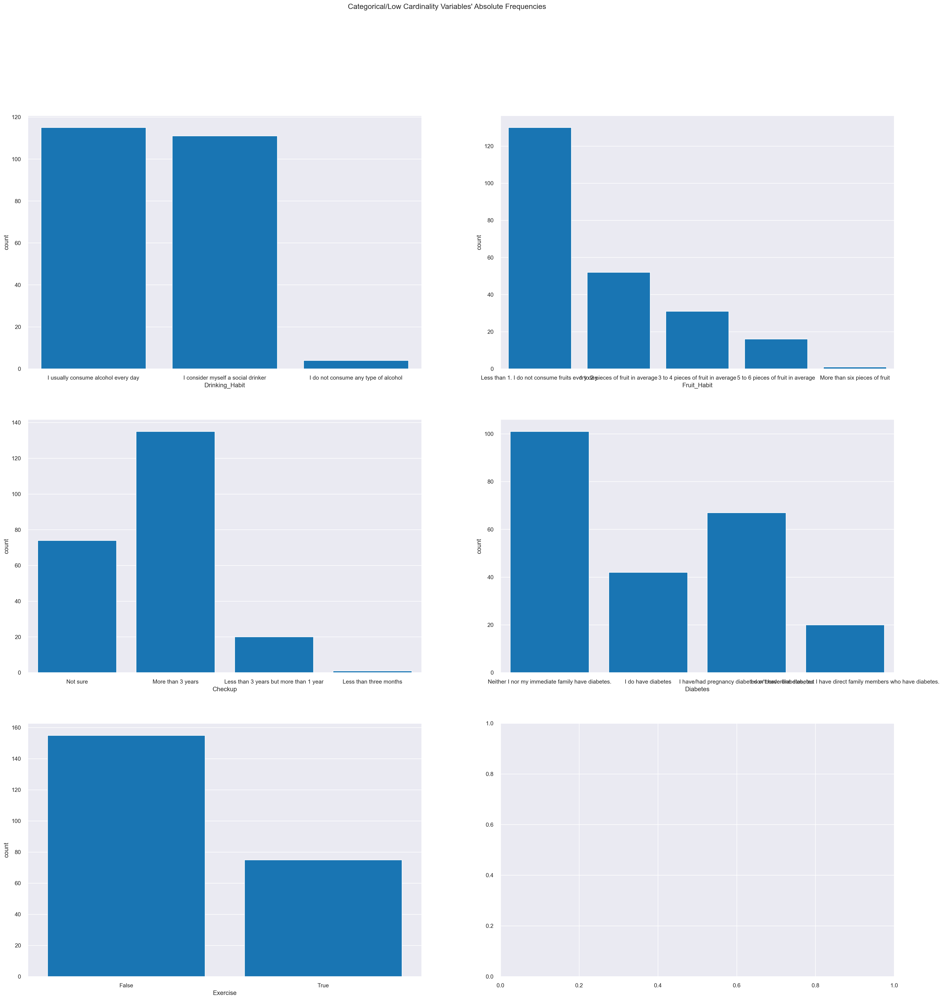

In [128]:
#Validation4

#All Non-Metric Variables' Absolute Frequencies  
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, 2, figsize=(30, 30))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
   sns.countplot(x=val_feat_trial4[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'categorical_variables_frequecies.png'), dpi=200)
plt.show()

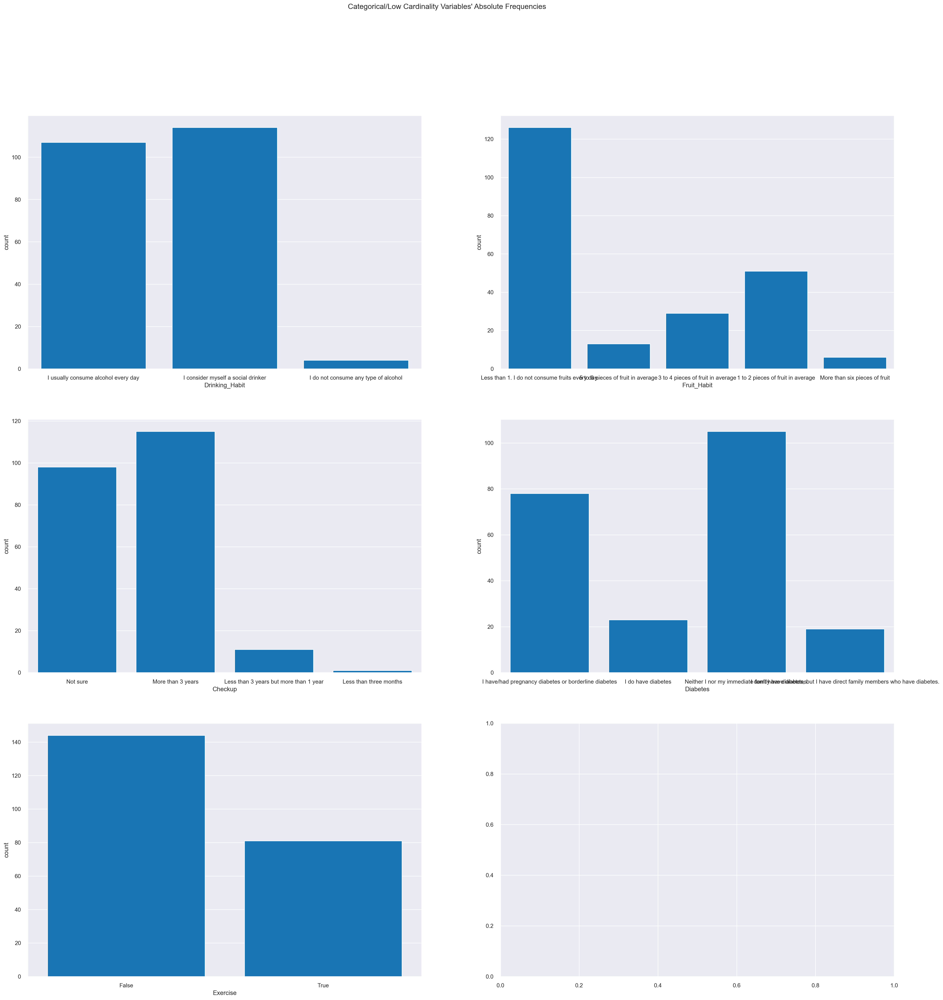

In [129]:
#Test

#All Non-Metric Variables' Absolute Frequencies  
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, 2, figsize=(30, 30))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
   sns.countplot(x=test_feat_trial4[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'categorical_variables_frequecies.png'), dpi=200)
plt.show()

#### Boxplots

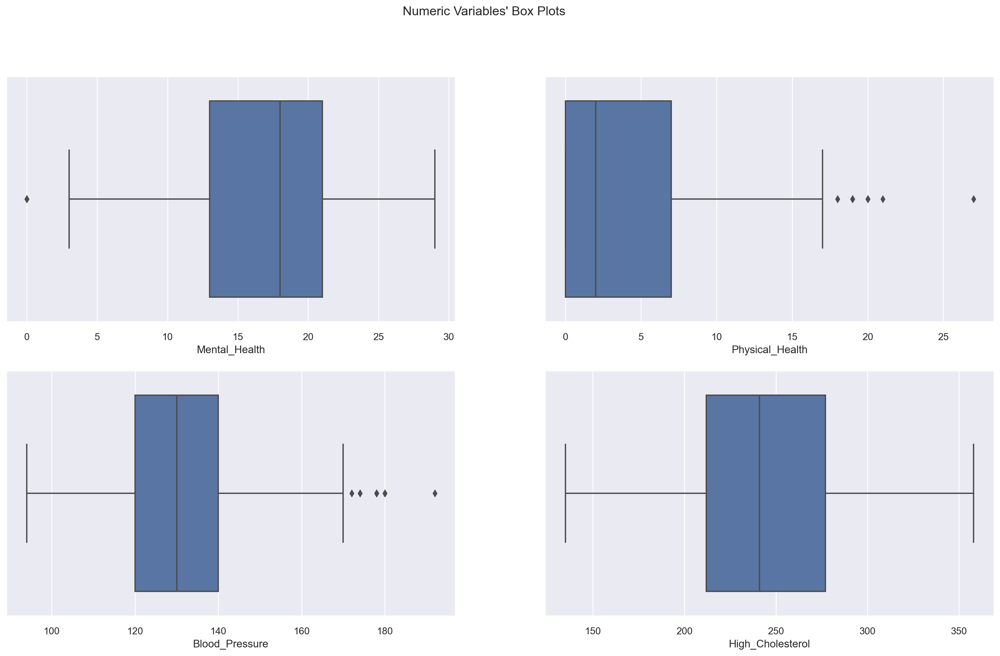

In [130]:
#Train
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_trial4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features_trial4): # Notice the zip() function and flatten() method
   sns.boxplot(x=train_feat_trial4[feat], ax=ax)
   
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'numeric_variables_boxplots.png'), dpi=200)
plt.show()

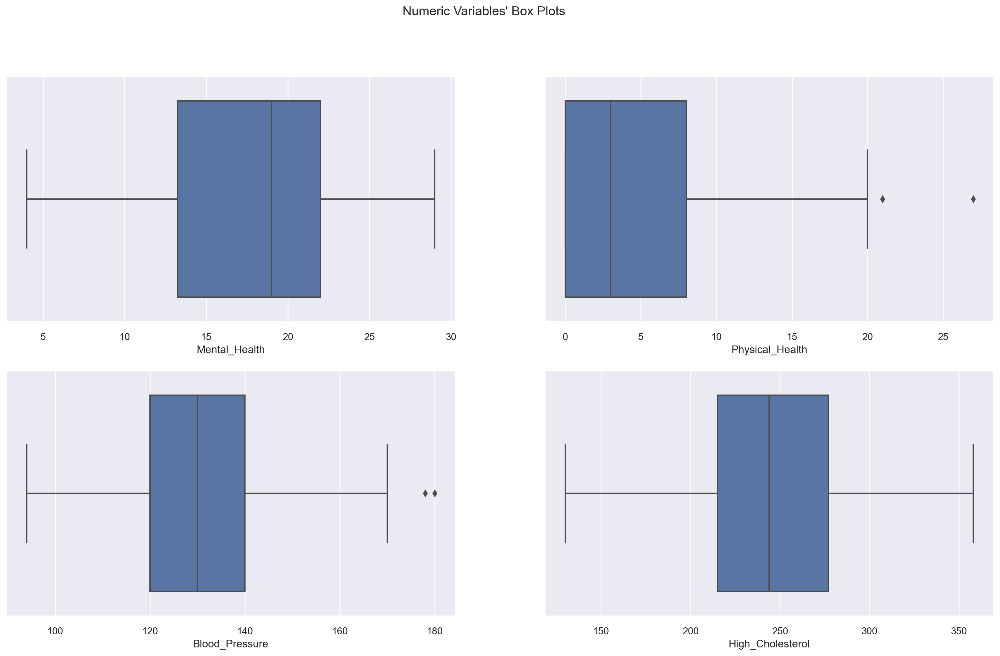

In [131]:

#Validation
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_trial4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features_trial4): # Notice the zip() function and flatten() method
   sns.boxplot(x=val_feat_trial4[feat], ax=ax)
   
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'numeric_variables_boxplots.png'), dpi=200)
plt.show()

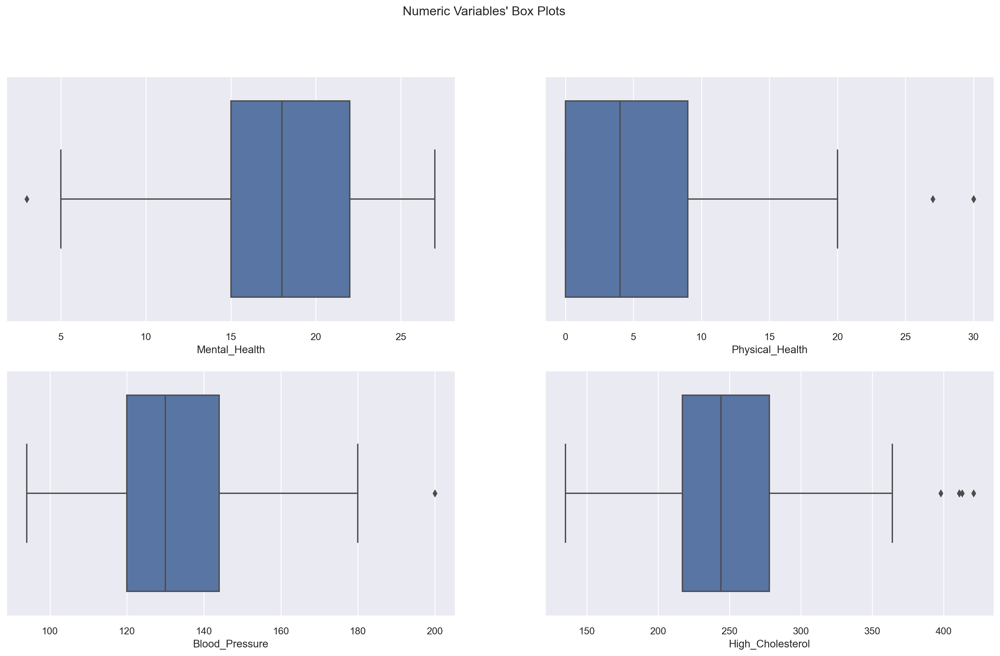

In [132]:
#Test
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_trial4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features_trial4): # Notice the zip() function and flatten() method
   sns.boxplot(x=test_feat_trial4[feat], ax=ax)
   
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'numeric_variables_boxplots.png'), dpi=200)
plt.show()

## 6. Model Building and Training

### Identifying Best Models

In [133]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn import model_selection
from sklearn.utils import class_weight
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import StratifiedKFold


In [134]:
def run_exps(X_train: pd.DataFrame , y_train: pd.DataFrame, X_test: pd.DataFrame, y_test: pd.DataFrame) -> pd.DataFrame:
    dfs = []
    models = [
              ('LogReg', LogisticRegression()), 
              ('RF', RandomForestClassifier()),
              ('KNN', KNeighborsClassifier()),
              ('SVM', SVC()), 
              ('GNB', GaussianNB()),
              ('NL', MLPClassifier()),
              ('DT', DecisionTreeClassifier()),
              ('KNN',KNeighborsClassifier()),
              ('BAG',BaggingClassifier()),
              ('ADA',AdaBoostClassifier()),
              ('GB',GradientBoostingClassifier()),
            ]
    results = []
    names = []
    scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
    target_names = ['malignant', 'benign']
    kfold = []
    cv_results = []
    clf = []
    y_pred = []
    this_df = []
    final = []  
    
    for name, model in models:
        kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=90210)
        cv_results = model_selection.cross_validate(model, X_train, y_train, cv=kfold, scoring=scoring)
        clf = model.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        #print(name)
        #print(classification_report(y_test, y_pred, target_names=target_names))
        results.append(cv_results)
        names.append(name)
        this_df = pd.DataFrame(cv_results)
        this_df['model'] = name
        dfs.append(this_df)
        final = pd.concat(dfs, ignore_index=True)
        
    return final.sort_values(by=['test_f1_weighted','test_accuracy'], ascending=False).head(10)

In [135]:
# Trial 1 : No Blood_Pressure
run_exps(X_train_feat_trial1, Y_train, X_val_feat_trial1, Y_val)

,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_roc_auc,model
6,0.166898,0.030998,0.972222,0.972454,0.972222,0.972254,0.997907,RF
8,0.137994,0.026431,0.971963,0.972104,0.971963,0.971948,0.994223,RF
43,0.031365,0.011682,0.962617,0.963202,0.962617,0.962571,0.992472,BAG
51,0.116607,0.008278,0.944444,0.944444,0.944444,0.944444,0.993373,GB
53,0.128311,0.008975,0.943925,0.944451,0.943925,0.943856,0.991246,GB
41,0.038363,0.013248,0.925926,0.928984,0.925926,0.926182,0.985002,BAG
7,0.154198,0.028605,0.925234,0.931763,0.925234,0.925589,0.976657,RF
46,0.097718,0.028668,0.916667,0.916608,0.916667,0.916557,0.972619,ADA
33,0.004990,0.008626,0.915888,0.915960,0.915888,0.915844,0.915266,DT
31,0.003663,0.009669,0.907407,0.910542,0.907407,0.907728,0.910708,DT


In [136]:
# Trial 2: No High_Cholesterol
run_exps(X_train_feat_trial2, Y_train, X_val_feat_trial2, Y_val)

,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_roc_auc,model
8,0.261209,0.048633,0.981308,0.981308,0.981308,0.981308,0.997199,RF
6,0.303295,0.055039,0.972222,0.972454,0.972222,0.972254,0.996512,RF
33,0.002992,0.008241,0.953271,0.953389,0.953271,0.953246,0.952731,DT
31,0.003989,0.006981,0.944444,0.944797,0.944444,0.944289,0.941053,DT
26,0.627501,0.008977,0.935185,0.935179,0.935185,0.935100,0.971399,NL
44,0.023759,0.010976,0.934579,0.934720,0.934579,0.934568,0.968553,BAG
43,0.025856,0.010838,0.934579,0.935787,0.934579,0.934442,0.990021,BAG
53,0.093906,0.006009,0.934579,0.935787,0.934579,0.934442,0.987745,GB
41,0.026709,0.011546,0.916667,0.921245,0.916667,0.916990,0.978898,BAG
9,0.217870,0.038179,0.915888,0.916019,0.915888,0.915873,0.960342,RF


In [137]:
# Trial 3: No Blood_Pressure or High_Cholesterol
run_exps(X_train_feat_trial3, Y_train, X_val_feat_trial3, Y_val)

,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_roc_auc,model
6,0.151593,0.029258,0.972222,0.972454,0.972222,0.972254,0.997210,RF
8,0.148064,0.029555,0.943925,0.944451,0.943925,0.943856,0.991597,RF
53,0.078440,0.006600,0.943925,0.944451,0.943925,0.943856,0.987745,GB
31,0.002991,0.008675,0.935185,0.937005,0.935185,0.935370,0.945588,DT
41,0.038678,0.011418,0.935185,0.935494,0.935185,0.935258,0.983432,BAG
32,0.002992,0.006988,0.934579,0.936474,0.934579,0.934788,0.957234,DT
46,0.092682,0.029303,0.925926,0.926161,0.925926,0.925718,0.972968,ADA
51,0.091527,0.005981,0.916667,0.916608,0.916667,0.916557,0.974887,GB
1,0.009977,0.012206,0.907407,0.907525,0.907407,0.907148,0.975933,LogReg
7,0.147192,0.031428,0.906542,0.913130,0.906542,0.906986,0.974341,RF


In [138]:
# Trial 4: With Blood_Pressure and High_Cholesterol 
run_exps(X_train_feat_trial4, Y_train, X_val_feat_trial4, Y_val)

,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_roc_auc,model
8,0.158073,0.025348,0.981308,0.981308,0.981308,0.981308,0.997549,RF
6,0.154469,0.028121,0.972222,0.972454,0.972222,0.972254,0.997733,RF
33,0.006705,0.015182,0.971963,0.972152,0.971963,0.971972,0.972339,DT
46,0.145091,0.036199,0.953704,0.953974,0.953704,0.953756,0.975410,ADA
51,0.129859,0.006498,0.944444,0.944797,0.944444,0.944289,0.980467,GB
53,0.098401,0.006980,0.943925,0.944451,0.943925,0.943856,0.987395,GB
41,0.047838,0.014016,0.935185,0.935494,0.935185,0.935258,0.976456,BAG
43,0.032021,0.014202,0.934579,0.935787,0.934579,0.934442,0.991947,BAG
31,0.004986,0.013239,0.925926,0.925926,0.925926,0.925926,0.924660,DT
26,0.590693,0.011967,0.925926,0.926161,0.925926,0.925718,0.973491,NL


Following the previous analysis we identify the following models are the best performing:

1. Random Forests
2. Decision Trees
3. Bagging
4. Gradient Boosting


In [139]:
X_train = X_train_feat_trial1
X_val = X_val_feat_trial1
test= test_trial1

### Model Training

#### Gradient Boosting

In [140]:
skf = StratifiedKFold(n_splits=4, random_state=None, shuffle=False)

def param_tuning(estimator, parameters):
    grid = GridSearchCV(estimator, parameters,scoring='f1_weighted', cv=skf)
    grid.fit(X_train, y_train.values.ravel())
    print('The parameters combination that would give best accuracy is : ')
    print(grid.best_params_)
    print('The best f1 achieved after parameter tuning via grid search is : ', grid.best_score_)

def classification(model):
    y_pred = model.predict(X_val)
    print(classification_report(y_val, y_pred, target_names=['Healthy', 'Sick']))

In [141]:
parameters_gb  = {
    "n_estimators":[5,50,250,500],
    "max_depth":[1,3,5,7,9],
    "learning_rate":[0.01,0.1,1,10,100]
}

estimator_gb = GradientBoostingClassifier()


In [142]:
param_tuning(estimator_gb, parameters_gb)

The parameters combination that would give best accuracy is : 
{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
The best f1 achieved after parameter tuning via grid search is :  0.9384547685908673


In [143]:
model_gb = GradientBoostingClassifier(learning_rate= 1, max_depth= 3, n_estimators= 50).fit(X_train, y_train)


#### Decision Trees

In [144]:
parameters_dc = {'criterion':['gini', 'entropy','log_loss'],
              'splitter': ['best', 'random'],
              'max_depth': ['none',15,20,25,30],
              'min_samples_split': [2,200,700],
              'min_samples_leaf': [1,100,500],
              'max_features': ['None','log2','auto',2,0.5],
              'max_leaf_nodes': [5,'None'],
              'min_impurity_decrease': [0,2]
             }

estimator_dc = DecisionTreeClassifier()


In [145]:
param_tuning(estimator_dc, parameters_dc)

The parameters combination that would give best accuracy is : 
{'criterion': 'entropy', 'max_depth': 20, 'max_features': 0.5, 'max_leaf_nodes': 5, 'min_impurity_decrease': 0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
The best f1 achieved after parameter tuning via grid search is :  0.8049939929282257


In [146]:
model_dc = DecisionTreeClassifier(criterion= 'gini', 
                                  max_depth= 20, 
                                  max_features= 'auto', 
                                  max_leaf_nodes= 5, 
                                  min_impurity_decrease= 0, 
                                  min_samples_leaf= 1, 
                                  min_samples_split= 2, 
                                  splitter= 'best').fit(X_train, y_train)

#### Random Forests

In [147]:
parameters_rf = {'criterion': ['gini', 'entropy', 'log_loss'],
              'max_depth': [None,3],
              'max_features': ['sqrt', 'log2', None],
              'bootstrap': [True,False],
              'oob_score': [True,False],
              'class_weight':['balanced', 'balanced_subsample']}

estimator_rf = RandomForestClassifier()

In [148]:
param_tuning(estimator_rf, parameters_rf)

The parameters combination that would give best accuracy is : 
{'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'oob_score': True}
The best f1 achieved after parameter tuning via grid search is :  0.9440219315203411


In [149]:
model_rf = RandomForestClassifier(bootstrap= True, 
                                  class_weight= 'balanced_subsample', 
                                  criterion= 'gini', 
                                  max_depth= None, 
                                  max_features= 'sqrt', 
                                  oob_score= False).fit(X_train, y_train)


### Scoring Assessment

In [150]:
# Gradient Boosting
classification(model_gb)

              precision    recall  f1-score   support

     Healthy       0.99      0.97      0.98       112
        Sick       0.97      0.99      0.98       118

    accuracy                           0.98       230
   macro avg       0.98      0.98      0.98       230
weighted avg       0.98      0.98      0.98       230



In [151]:
# Decision Tree
classification(model_dc)

              precision    recall  f1-score   support

     Healthy       0.78      0.66      0.71       112
        Sick       0.72      0.82      0.77       118

    accuracy                           0.74       230
   macro avg       0.75      0.74      0.74       230
weighted avg       0.75      0.74      0.74       230



In [152]:
# Random Forest
classification(model_rf)

              precision    recall  f1-score   support

     Healthy       0.99      0.97      0.98       112
        Sick       0.97      0.99      0.98       118

    accuracy                           0.98       230
   macro avg       0.98      0.98      0.98       230
weighted avg       0.98      0.98      0.98       230



# Submission Generator

In [153]:
#create a function which will generate the path after user will input the correct name 

In [154]:
def foo(username):
    first = "/Users/"
    last = "/Desktop/ML project/Submission.csv"
    result = first + username + last 
    return result

In [162]:
user_name=input("Please enter your username to generate the path:")


z=foo(user_name)

KeyboardInterrupt: Interrupted by user

In [ ]:
X = pd.concat([X_train,X_val])
y = pd.concat([y_train,y_val])

In [ ]:
final_model= model_rf
clf = final_model.fit(X, y)
pred = clf.predict(test)

Submission = pd.DataFrame(pred.astype(int), index=test.index, columns=['Disease'])
from pathlib import Path
filepath = Path(z)  
filepath.parent.mkdir(parents=True, exist_ok=True)  
Submission.to_csv(filepath)  